# Top stuff

In [2]:
import xmitgcm as xm
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
%matplotlib ipympl
import matplotlib.colors as mcolors
import xhistogram.xarray as xhist
import jmkfigure

<IPython.core.display.Javascript object>

### Plot the new runs.

These have been run for 30 tidal periods.  Dye is introduced at 20 tidal periods.  Layer fluxes are tracked.

In [3]:
runs = {}
runs['Slope2D001'] = 'single slope: N0 = 2e-3, forcing 0.6 m/s; dhdx = 0.7 om / N0'
runs['Slope2D002'] = 'multiple slopes: N0 = 2e-3, forcing 0.6 m/s; alternate 1.5 and 0.5 om/N0'
runs['Slope2D003'] = 'single slope: N0 = 2e-3, k=1e-2; no forcing'
runs['Slope2D004'] = 'single slope: N0 = 2e-3, k=4e-2; no forcing'
runs['Slope2D008'] = 'multiple slopes: N0 = 2e-3, k=4e-2; no forcing'  # hmm annoying that I changed the K value.

print(runs)

{'Slope2D001': 'single slope: N0 = 2e-3, forcing 0.6 m/s; dhdx = 0.7 om / N0', 'Slope2D002': 'multiple slopes: N0 = 2e-3, forcing 0.6 m/s; alternate 1.5 and 0.5 om/N0', 'Slope2D003': 'single slope: N0 = 2e-3, k=1e-2; no forcing', 'Slope2D004': 'single slope: N0 = 2e-3, k=4e-2; no forcing', 'Slope2D008': 'multiple slopes: N0 = 2e-3, k=4e-2; no forcing'}


In [40]:
forcedreadme = """
2025-08-09 22:34:29
../results/Slope2D059/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, const strat.  Longer run, and layer diagnostic running alpha =0.55


2025-08-09 22:33:59
../results/Slope2D058/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, exp strat.  Longer run, and layer diagnostic running alpha =0.55


2025-08-09 12:33:17
../results/Slope2D057/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, const strat.  Longer run, and layer diagnostic running alpha =0.4


2025-08-09 12:32:35
../results/Slope2D056/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, exp strat.  Longer run, and layer diagnostic running alpha =0.4

2025-08-08 20:26:35
../results/Slope2D055/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, const strat.  Longer run, and layer diagnostic running alpha =1.0


2025-08-08 20:26:14
../results/Slope2D054/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, exponential strat.  Longer run, and layer diagnostic running alpha =1.0


2025-08-08 09:36:25
../results/Slope2D053/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, exponential strat.  Longer run, and layer diagnostic running


2025-08-08 09:35:59
../results/Slope2D052/input/
Kl10, tidal forcing=0.3 m/s N00 = 2e-3, linear strat.  Longer run, and layer diagnostic running


2025-08-08 09:35:43
../results/Slope2D052/input/
Kl10, tidal forcing=0.6 m/s N00 = 2e-3, linear strat.  Longer run, and layer diagnostic running


2025-08-07 16:40:00
../results/Slope2D051/input/
Kl10, tidal forcing=0.6 m/s N00 = 2e-3, linear strat.  Longer run, and layer diagnostic running


2025-08-07 16:37:45
../results/Slope2D050/input/
Kl10, tidal forcing=0.6 m/s N00 = 2e-3, linear strat.  Longer run, and layer diagnostic running
"""
# parse the forcedreadme into forcedruns: need to know run number, forcing, N0, exponential or linear strat and alpha.  If alpha not known, assume = 0.7
# Each run is over three text lines in forcedreadme.  The runnumber is in the second line.  The rest of the info in the third:
forcedruns = {}
for line in forcedreadme.split("\n"):
    if "input" in line:
        run_number = line.split("/")[-3]
        forcedruns[run_number] = {}
    if "Kl10" in line:
        forcedruns[run_number]["forcing"] = float(line.split("tidal forcing=")[-1].split(" ")[0])
        forcedruns[run_number]["N0"] = float(line.split("N00 =")[-1].split(",")[0])
        if "exponential strat" in line:
            forcedruns[run_number]["strat"] = "exponential"
        if "linear strat" in line:
            forcedruns[run_number]["strat"] = "linear"
        if "alpha" in line:
            forcedruns[run_number]["alpha"] = float(line.split("alpha =")[-1])
        else:
            forcedruns[run_number]["alpha"] = 0.7


print(forcedruns)

{'Slope2D059': {'forcing': 0.3, 'N0': 0.002, 'alpha': 0.55}, 'Slope2D058': {'forcing': 0.3, 'N0': 0.002, 'alpha': 0.55}, 'Slope2D057': {'forcing': 0.3, 'N0': 0.002, 'alpha': 0.4}, 'Slope2D056': {'forcing': 0.3, 'N0': 0.002, 'alpha': 0.4}, 'Slope2D055': {'forcing': 0.3, 'N0': 0.002, 'alpha': 1.0}, 'Slope2D054': {'forcing': 0.3, 'N0': 0.002, 'strat': 'exponential', 'alpha': 1.0}, 'Slope2D053': {'forcing': 0.3, 'N0': 0.002, 'strat': 'exponential', 'alpha': 0.7}, 'Slope2D052': {'forcing': 0.6, 'N0': 0.002, 'strat': 'linear', 'alpha': 0.7}, 'Slope2D051': {'forcing': 0.6, 'N0': 0.002, 'strat': 'linear', 'alpha': 0.7}, 'Slope2D050': {'forcing': 0.6, 'N0': 0.002, 'strat': 'linear', 'alpha': 0.7}}


<xarray.Dataset> Size: 22MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/44)
  * XC                   (XC) float64 8kB -143.7 -138.1 -133.1 ... -0.2 -0.1 0.0
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    rSurfW               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInS              (XC) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 20.67 20.74 ... 27.85
  * layer_1TH_center     (layer_1TH_center) float64 800B 20.7 20.78 ... 27.82
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 20.74 ... 27.78
Data variables:
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC02               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>

<xarray.Dataset> Size: 51MB
Dimensions:              (XC: 960, YC: 1, XG: 960, YG: 1, Z: 200, Zp1: 201,
                          Zu: 200, Zl: 200, layer_1TH_bounds: 101,
                          layer_1TH_center: 100, layer_1TH_interface: 99,
                          time: 30)
Coordinates: (12/46)
  * XC                   (XC) float64 8kB 2.957e+03 8.554e+03 ... 1.466e+05
  * YC                   (YC) float64 8B 50.0
  * XG                   (XG) float64 8kB 0.0 5.914e+03 ... 1.465e+05 1.466e+05
  * YG                   (YG) float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    dyF                  (YC, XC) float64 8kB dask.array<chunksize=(1, 960), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 20.67 20.74 ... 27.85
  * layer_1TH_center     (layer_1TH_center) float64 800B 20.7 20.78 ... 27.82
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 20.74 ... 27.78
    iter                 (time) int64 240B dask.array<chunksize=(1,), meta=np.ndarray>
  * time                 (time) timedelta64[ns] 240B 0 days 12:24:00 ... 15 d...
Data variables:
    LaUH1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
    LaHw1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='../results/Sl...

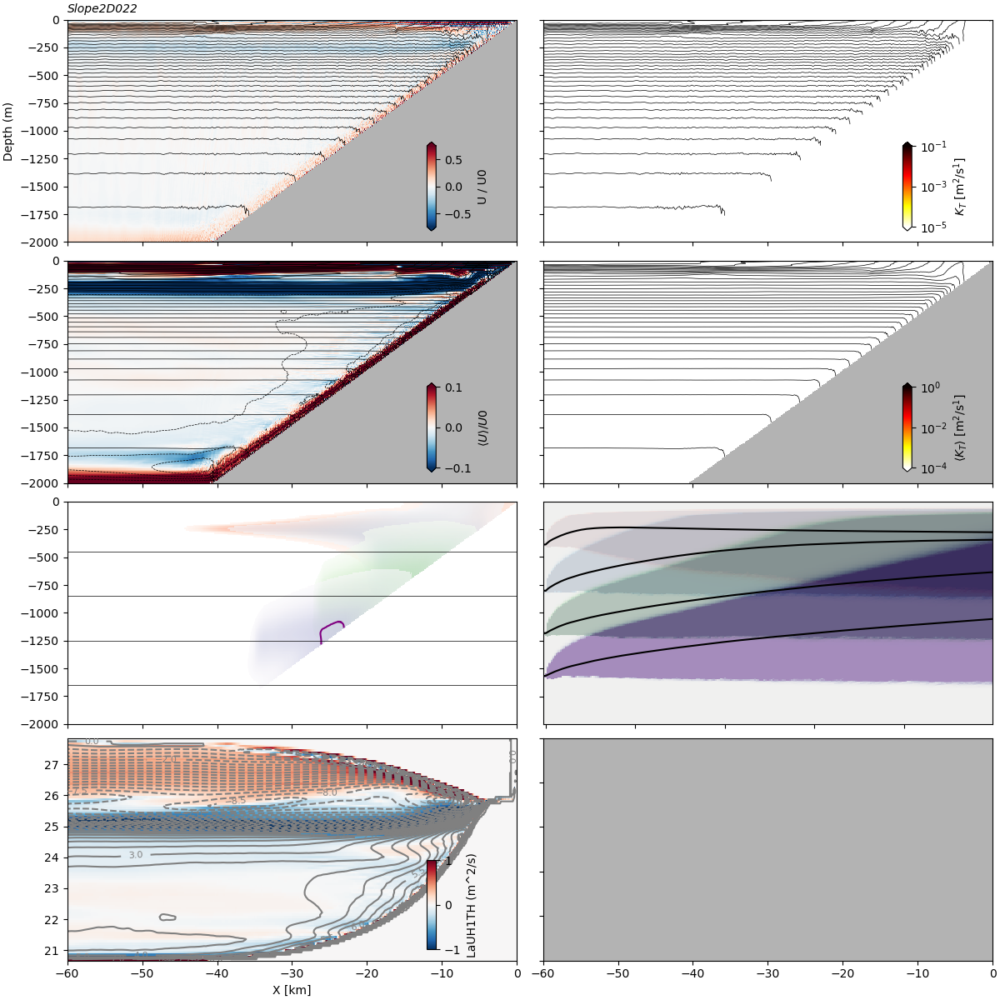

In [133]:
# summary plot:
for runname in ['Slope2D022']:
    fig, axs = plt.subplots(4, 2, figsize=(12, 12), constrained_layout=True, sharex=False, sharey=False,
                            subplot_kw={'facecolor': '0.7'})

    for nn, a  in enumerate(axs.flatten()):
        if nn != 5:
            a.sharex(axs[0, 0])

    thetalevels = np.arange(24, 30, 0.2)
    u0 = 0.6
    clear_cache = False
    xlims = [-60, 0]

    # a snapshot:
    if True:
        with (xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['spinup'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as ds0, xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['dissipation'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as dsdiss0):
            ds = ds0.isel(YC=0, YG=0, time=-1)
            ds['XG'] = (ds['XG'] - ds.XC[-1]) / 1000
            ds['XC'] = (ds['XC'] - ds.XC[-1]) / 1000
            dsdiss = dsdiss0.isel(YC=0, YG=0, time=-1)
            ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
            ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)


            ax = axs[0, 0]
            pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'] / u0, clim=[-0.75, 0.75], cmap='RdBu_r', rasterized=True)
            ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
            cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
            cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label='U / U0')
            ax.set_title(f'{runname}', loc='left', fontsize='medium', fontstyle='italic')
            ax.set_xlim(xlims)

            ax = axs[0, 1]
            pc = ax.pcolormesh(ds.XG, ds.Z, dsdiss['KLviscAr'], norm=mcolors.LogNorm(vmin=1e-5, vmax=1e-1), cmap='hot_r', rasterized=True)
            ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
            cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
            cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$K_T\ \mathrm{[m^2/s^1]}$')

    if True:
        with xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=clear_cache
                                ) as ds0:
            ds0['XG'] = (ds0['XG'] - ds0.XC[-1]) / 1000
            ds0['XC'] = (ds0['XC'] - ds0.XC[-1]) / 1000
            ds = ds0.isel(YC=0, YG=0, time=slice(-2, None)).mean(dim='time')
            display(ds)
            ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
            ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
            ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

            ax = axs[1, 0]
            pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'] / u0, clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
            psi = ds.UVEL.cumsum(dim='Z') * 10 + 0* ds.UVEL
            ax.contour(ds.XG, ds.Z, psi, levels=np.arange(-10, 10, 2), colors='k', linewidths=0.5)
            ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
            cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
            cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$\left<U\right> / U0$')

            # Kt average\
            ax = axs[1, 1]
            if True:
                pc = ax.pcolormesh(ds.XG, ds.Z, ds['KLviscAr'], norm=mcolors.LogNorm(vmin=1e-4, vmax=1e-0), cmap='hot_r', rasterized=True)
                ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
                cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
                cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$\left<K_T\right>\ \mathrm{[m^2/s^1]}$')
            else:
                pc = ax.pcolormesh(ds.XG, ds.Z, ds['WVEL'] / u0, clim=[-0.001, 0.001], cmap='RdBu_r', rasterized=True)
                ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
                cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
                cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$\left<U\right> / U0$')

            ax = axs[2, 0]
            ax.set_facecolor('w')

            ds = ds0.isel(YC=0, YG=0, time=-2)
            cmps = ['Reds', 'Blues', 'Greens', 'Purples']
            col = ['r', 'b', 'g', 'purple']

            for td in range(1, 5):
                t = ds[f'TRAC{td:02}'].where(ds['THETA'].values > 0).where(ds[f'TRAC{td:02}'].values > 0.1)
                pc = ax.pcolormesh(ds.XG, ds.Z, t, cmap=cmps[td-1], rasterized=True, alpha=0.6, clim=[0, 4])
                ax.contour(ds.XG, ds.Z, t, colors=col[td-1], levels=[1.5], vmin=0, vmax=2)
            depths = [-450, -850, -1250, -1650]
            for d in depths:
                ax.axhline(d, color='k', lw=0.5)
    ax.set_xlim(xlims)

    ax = axs[2, 1]
    with xm.open_mdsdataset(f'../results/{runname}/input/', iters='all', endian='<', prefix='spinup', clear_cache=clear_cache) as ds0:
        ds0 = ds0.isel(YC=0, YG=0).sel(XC=slice(-180_000, None))
        ds0['time'] = ds0.time.astype(float) / 1e9 / 3600 / 12.4
        T0 = ds0['THETA'].isel(time=0, XC=0)

        ds0 = ds0.isel(time=slice(20*24-1, None))
        for nn in range(1, 5):
            hist = xhist.histogram(ds0['THETA'], bins=T0.values[::1][::-1], weights=ds0[f'TRAC{nn:02d}'], dim=['Z', 'XC'])
            z0 = np.interp(hist.THETA_bin, T0.values[::-1], ds0.Z[::-1])
            pc = ax.pcolormesh(hist.time.values, z0, hist.values.T, cmap=cmps[nn-1], vmin=0, vmax=2.5, alpha=0.4, rasterized=True) #, vmax=8000, rasterized=True)
            meand = np.sum(hist.values*z0[np.newaxis,:], axis=1) / np.sum(hist.values, axis=1)
            ax.plot(hist.time.values, meand, color='k')
    axs[2, 1].set_xlabel('Tidal periods')


    ax = axs[3, 0]
    with xm.open_mdsdataset(f'../results/{runname}/input/', iters='all', endian='<', prefix='layDiag') as ds0:
        display(ds0)
        ds0 = ds0.isel(YC=0, YG=0, time=slice(-5, None))
        ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
        ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3

        pc = ax.pcolormesh(ds0.XG, ds0.layer_1TH_center, ds0.LaUH1TH.mean(dim='time'), cmap='RdBu_r', vmin=-1, vmax=1, rasterized=True)
        cum = ds0.LaUH1TH.cumsum(dim='layer_1TH_center').mean(dim='time')
        cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=np.arange(-15, 15, 0.5), colors='0.5')
        ax.clabel(cs, inline=True, fontsize=8)
        cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
        fig.colorbar(pc, cax=cax, label='LaUH1TH (m^2/s)', orientation='vertical', shrink=0.8)
        ax.set_facecolor('0.6')

    for ax in axs.flatten():
        ax.label_outer()
    axs[0, 0].set_ylabel('Depth (m)')
    axs[-1, 0].set_xlabel('X [km]')
    fig.savefig(f'doc/{runname}_summary.pdf', dpi=300)

In [134]:
ds

<xarray.Dataset> Size: 22MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/46)
  * XC                   (XC) float64 8kB -143.7 -138.1 -133.1 ... -0.2 -0.1 0.0
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 20.67 20.74 ... 27.85
  * layer_1TH_center     (layer_1TH_center) float64 800B 20.7 20.78 ... 27.82
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 20.74 ... 27.78
    iter                 int64 8B dask.array<chunksize=(), meta=np.ndarray>
    time                 timedelta64[ns] 8B 14 days 23:36:00
Data variables:
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC02               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='../results/Sl...

<xarray.Dataset> Size: 22MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/44)
  * XC                   (XC) float64 8kB -143.7 -138.1 -133.1 ... -0.2 -0.1 0.0
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    rSurfW               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInS              (XC) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.92 23.96 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.96 24.0 ... 27.94
Data variables:
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC02               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>

<xarray.Dataset> Size: 22MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/44)
  * XC                   (XC) float64 8kB -143.7 -138.1 -133.1 ... -0.2 -0.1 0.0
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    rSurfW               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInS              (XC) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.92 23.96 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.96 24.0 ... 27.94
Data variables:
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC02               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>

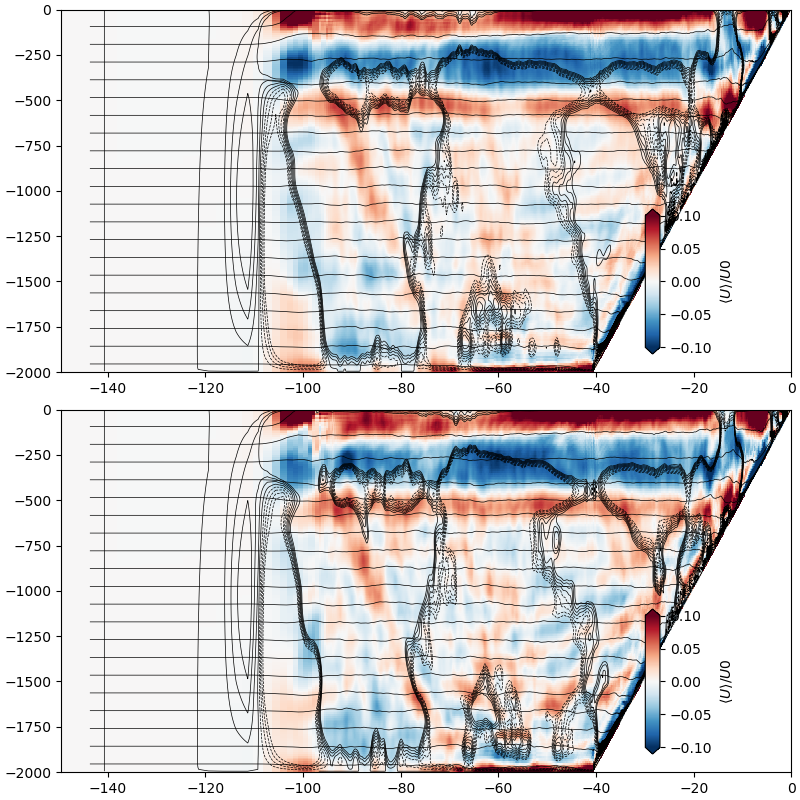

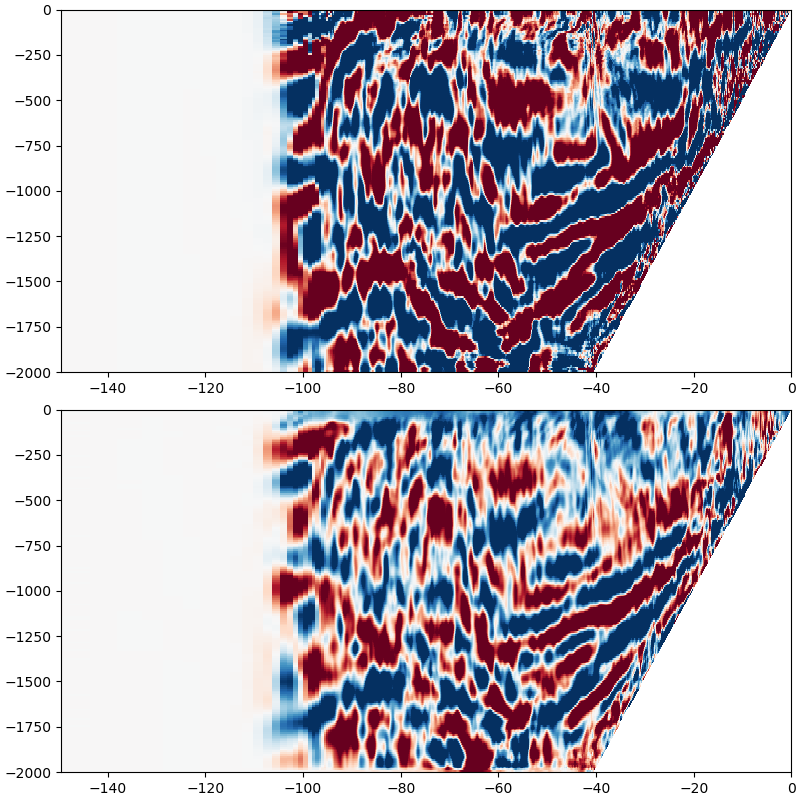

In [135]:
runname = 'Slope2D001'
with xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=clear_cache
                                ) as ds0:
            ds0['XG'] = (ds0['XG'] - ds0.XC[-1]) / 1000
            ds0['XC'] = (ds0['XC'] - ds0.XC[-1]) / 1000
            ds = ds0.isel(YC=0, YG=0, time=slice(-6, -3)).mean(dim='time')
            display(ds)
            ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
            ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
            ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

            fig, axs = plt.subplots(2, 1, layout='constrained', figsize=(8, 8))
            ax = axs[0]
            pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'] / u0, clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
            psi = ds.UVEL.cumsum(dim='Z') * 10 + 0* ds.UVEL
            ax.contour(ds.XG, ds.Z, psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
            ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
            cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
            cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$\left<U\right> / U0$')
            ds1 = ds

            ds = ds0.isel(YC=0, YG=0, time=slice(-3, -1)).mean(dim='time')
            display(ds)
            ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
            ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
            ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

            ax = axs[1]
            pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'] / u0, clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
            psi = ds.UVEL.cumsum(dim='Z') * 10 + 0* ds.UVEL
            ax.contour(ds.XG, ds.Z, psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
            ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
            cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
            cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$\left<U\right> / U0$')

            # compare
            fig, axs = plt.subplots(2, 1, layout='constrained', figsize=(8, 8))
            ax = axs[0]
            ax.pcolormesh(ds.XG, ds.Z, (ds.UVEL - ds1.UVEL) / u0, clim=[-0.01, 0.01], cmap='RdBu_r', rasterized=True)

            ax = axs[1]
            ax.pcolormesh(ds.XG, ds.Z, (ds.THETA - ds1.THETA), clim=[-0.01, 0.01], cmap='RdBu_r', rasterized=True)

In [4]:
runname = 'Slope2D050'
with xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=clear_cache
                                ) as ds0:
    ds0['XG'] = (ds0['XG'] - ds0.XC[-1])
    ds0['XC'] = (ds0['XC'] - ds0.XC[-1])
    ds = ds0.isel(YC=0, YG=0, time=slice(-5, None)).mean(dim='time')
    display(ds)
    ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
    ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
    ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

    fig, ax = plt.subplots(3, 1, layout='constrained', figsize=(8, 8))
    X, Z = np.meshgrid(ds.XG, ds.Z)
    om = np.pi *2 / 12.4 / 3600
    N0 = 2e-3
    ang = np.atan2(2000, 40.637*1000,)
    ang = np.atan2(0.7*om/N0, 1)
    print(ang)
    kappa = 4e-2
    alpha = 0.7*om/N0
    gamma = (N0**2 * np.sin(alpha)**2/4/kappa**2)**(0.25)
    print('vertical scale $\gamma$ = ', 1/gamma)

    vscale = 2*kappa*gamma / np.tan(alpha)
    print(vscale)
    print('alpha'   , alpha)
    print('transport?', kappa/np.tan(alpha))

    pc = ax[0].pcolormesh(X, Z, ds['UVEL'], clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
    ax[0].contour(X, Z, psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
    ax[0].set_ylabel('$Z\ [m]$')
    ax[0].set_xlabel('$X\ [m]$')
    fig.colorbar(pc, ax=ax[0], label='$u\ \mathrm{\left[m/s\\right]}$', orientation='vertical', shrink=0.8, extend='both')
    ax[0].set_title('a) $\kappa = $' + f'{kappa:1.2e}' + ' $\mathrm{m^2/s}$' + ' ' +'$dh/dx = $' +
                f'{0.7*om/N0:1.2e}', loc='left', fontsize='medium', fontstyle='italic')
    ax[0].add_patch(plt.Rectangle((-27000, -1300), 7000, 400, color='0.5', alpha=0.5))

    AA  = (X+1j*Z)*np.exp(-1j*ang)
    ax[1].contour(np.real(AA), np.imag(AA), psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
    U = ds.UVEL + 1j*ds.WVEL.values
    U = U*np.exp(-1j*ang)
    pc = ax[1].pcolormesh(np.real(AA), np.imag(AA), np.real(U) / vscale, clim=[-0.5, 0.5], cmap='RdBu_r', rasterized=True)
    fig.colorbar(pc, ax=ax[1], label='$u^* /\ u_s$', orientation='vertical', shrink=0.8, extend='both')
    ax[1].contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
    ax[1].set_ylim([-10, 200])
    ax[1].set_xlim([-43000, 0])
    ax[1].set_ylabel('$Z^*\ [m]$')
    ax[1].set_title(f'b) Slope-coordinates; along-slope velocity;  $u_s$ = {vscale:1.2e} '+r'$\mathrm{m/s}$', loc='left', fontsize='medium', fontstyle='italic')

    ax[2].contour(np.real(AA), np.imag(AA), psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
    pc = ax[2].pcolormesh(np.real(AA), np.imag(AA), np.imag(U) / vscale, clim=[-0.01, 0.01], cmap='RdBu_r', rasterized=True)
    #ax[2].contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
    ax[2].set_ylim([-10, 200])
    ax[2].set_xlim([-43000, 0])
    fig.colorbar(pc, ax=ax[2], label='$w^* /\ u_s$', orientation='vertical', shrink=0.8, extend='both')
    ax[2].set_xlabel('$X^*\ [m]$')
    ax[2].set_ylabel('$Z^*\ [m]$')
    ax[2].set_title('c) Slope-coordinates; perpendicular velocity', loc='left', fontsize='medium', fontstyle='italic')

    for a in ax:
        a.set_facecolor('0.6')
    jmkfigure.jmksavenb(f'{runname}_slopeCoords', dpi=300, kinds=['pdf'])

    fig, axs = plt.subplots(3, 1, layout='constrained', figsize=(5.7, 6), sharex=True, sharey=True)
    ax = axs[0]
    pc = ax.pcolormesh(X, Z, ds['UVEL'], clim=[-0.05, 0.05], cmap='RdBu_r', rasterized=True)
    ax.contour(X, Z, psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
    ax.contour(X, Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
    ax.set_ylabel('$Z\ [m]$')
    fig.colorbar(pc, ax=ax, label='$u\ \mathrm{\left[m/s\\right]}$', orientation='vertical', shrink=0.8, extend='both')
    ax.set_title('a) Slope detail', loc='left', fontsize='medium', fontstyle='italic')
    ax.set_xlim([-27_000, -20_000])
    ax.set_ylim([-1300, -901])
    ax.set_facecolor('0.6')

    ax = axs[1]
    dsD = ds0.isel(YC=0, YG=0, time=-7)
    dsD0 = ds0.isel(YC=0, YG=0, time=0)
    dsD['TRAC03'] = dsD['TRAC03'].where(ds['THETA'].values > 0)

    ax.contour(X, Z, dsD0['TRAC03'], cmap='Purples', rasterized=True)
    pc = ax.pcolormesh(X, Z, dsD['TRAC03'], cmap='Purples', rasterized=True)
    ax.contour(X, Z, psi, levels=np.arange(-1, 1, 0.25), colors='k', linewidths=0.5)
    ax.contour(X, Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
    #ax.set_xlim([-24_000, -18_000])
    #ax.set_ylim([-1100, -800])
    ax.set_facecolor('0.6')
    ax.set_title('b) Dye after 2.067 days', loc='left', fontsize='medium', fontstyle='italic')
    fig.colorbar(pc, ax=ax, label='$C_3$', orientation='vertical', shrink=0.8, extend='both')

    ds['drhodx'] = ds.THETA.differentiate(coord='XC') * -0.2
    ds['drhodz'] = ds.THETA.differentiate(coord='Z') * -0.2

    ax = axs[2]
    pc = ax.pcolormesh(X, Z, 1000*np.sqrt(ds.drhodz**2+ds.drhodx**2), cmap='hot_r', rasterized=True, clim=[0, 1])
    fig.colorbar(pc, label='$10^3 \\left| \\nabla \\rho \\right| \sim \\left|\mathbf{J_b}\\right|$', shrink=0.8,
                 ax=ax, extend='both')
    ax.contour(X, Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
    ax.set_xlabel('$X\ [m]$')
    ax.set_title('c) strength of density gradient', loc='left', fontsize='medium', fontstyle='italic')

    jmkfigure.jmksavenb(f'{runname}_slopeDetail', dpi=300, kinds=['pdf'])




<>:25: SyntaxWarning: invalid escape sequence '\g'
<>:34: SyntaxWarning: invalid escape sequence '\ '
<>:35: SyntaxWarning: invalid escape sequence '\ '
<>:36: SyntaxWarning: invalid escape sequence '\ '
<>:37: SyntaxWarning: invalid escape sequence '\k'
<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:46: SyntaxWarning: invalid escape sequence '\ '
<>:50: SyntaxWarning: invalid escape sequence '\ '
<>:58: SyntaxWarning: invalid escape sequence '\ '
<>:59: SyntaxWarning: invalid escape sequence '\ '
<>:60: SyntaxWarning: invalid escape sequence '\ '
<>:72: SyntaxWarning: invalid escape sequence '\ '
<>:73: SyntaxWarning: invalid escape sequence '\ '
<>:99: SyntaxWarning: invalid escape sequence '\s'
<>:102: SyntaxWarning: invalid escape sequence '\ '
<>:25: SyntaxWarning: invalid escape sequence '\g'
<>:34: SyntaxWarning: invalid escape sequence '\ '
<>:35: SyntaxWarning: invalid escape sequence '\ '
<>:36: SyntaxWarning: invalid escape sequence '\ '
<>:37: SyntaxWarning: invalid 

NameError: name 'clear_cache' is not defined

<xarray.Dataset> Size: 51MB
Dimensions:              (XC: 960, YC: 1, XG: 960, YG: 1, Z: 200, Zp1: 201,
                          Zu: 200, Zl: 200, layer_1TH_bounds: 101,
                          layer_1TH_center: 100, layer_1TH_interface: 99,
                          time: 30)
Coordinates: (12/46)
  * XC                   (XC) float64 8kB 2.957e+03 8.554e+03 ... 1.466e+05
  * YC                   (YC) float64 8B 50.0
  * XG                   (XG) float64 8kB 0.0 5.914e+03 ... 1.465e+05 1.466e+05
  * YG                   (YG) float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    dyF                  (YC, XC) float64 8kB dask.array<chunksize=(1, 960), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.93 23.97 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.95 23.99 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.97 ... 27.94
    iter                 (time) int64 240B dask.array<chunksize=(1,), meta=np.ndarray>
  * time                 (time) timedelta64[ns] 240B 0 days 12:24:00 ... 15 d...
Data variables:
    LaUH1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
    LaHw1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='../results/Sl...

<xarray.DataArray 'layer_1TH_center' ()> Size: 8B
array(24.76)
Coordinates:
    YC                float64 8B 50.0
    YG                float64 8B 0.0
    layer_1TH_center  float64 8B 24.76
Attributes:
    standard_name:  ocean_layer_coordinate_1TH_center
    long_name:      center points of layer 1TH
    axis:           1TH
Figure(1000x600)


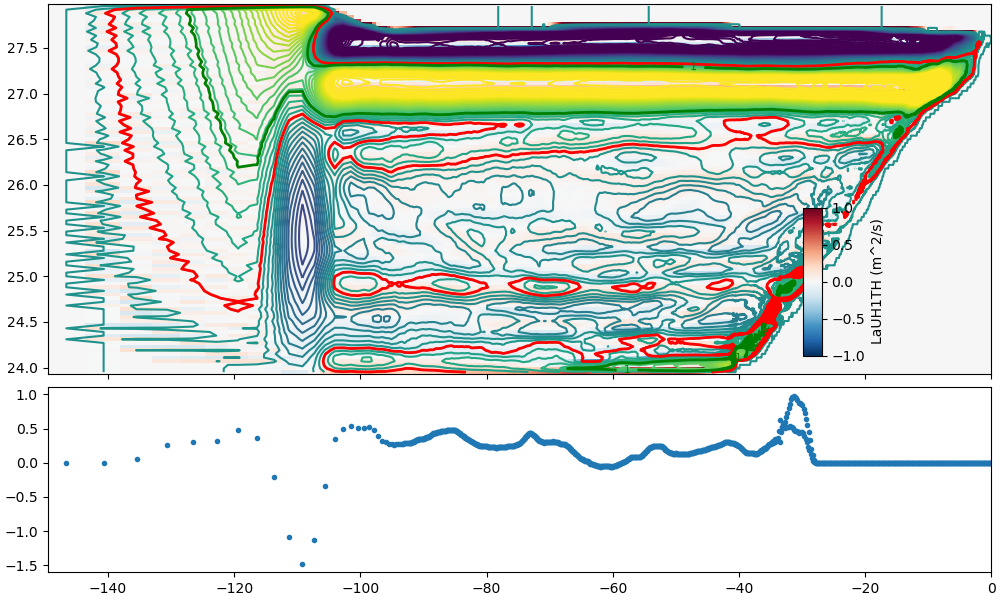

In [3]:
runname = 'Slope2D050'
fig, axs = plt.subplots(2, 1, layout='constrained', figsize=(10, 6), sharex=True,
                        height_ratios=[1, 0.5])
with xm.open_mdsdataset(f'../results/{runname}/input/', iters='all', endian='<', prefix='layDiag') as ds0:
    display(ds0)
    ds0 = ds0.isel(YC=0, YG=0, time=slice(-10, None))
    ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
    ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
    ax = axs[0]
    pc = ax.pcolormesh(ds0.XG, ds0.layer_1TH_center, ds0.LaUH1TH.mean(dim='time'), cmap='RdBu_r', vmin=-1, vmax=1, rasterized=True)
    cum = ds0.LaUH1TH.cumsum(dim='layer_1TH_center').mean(dim='time')
    cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=np.arange(-15, 15, 0.15), vmin=-3, vmax=+3)
    cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[0.3], colors='r', vmin=-3, vmax=+3, linewidths=2)
    cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[1], colors='g', vmin=-3, vmax=+3, linewidths=2)
    ax.clabel(cs, inline=True, fontsize=8)
    cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
    fig.colorbar(pc, cax=cax, label='LaUH1TH (m^2/s)', orientation='vertical', shrink=0.8)
    ax.set_facecolor('0.6')
    ax = axs[1]
    print(ds0.layer_1TH_center[20])
    ax.plot(ds0.XG, cum[25,:], '.')
jmkfigure.jmksavenb(f'{runname}_OT', dpi=300, kinds=['pdf'])

## Plot OT versus K for runs w/ exponential K

In [177]:
# summarize the overturning strengths.  It seems the OT strength at -60 km is a reasonable large-scale estimate, and the max-this is for the slope local strength.

runs = {'Slope2D024':'KC=1e-5; Nexp', 'Slope2D028':'K0=1e-3; Nexp', 'Slope2D021': 'K0=1e-2; Nexp', 'Slope2D023':'K0=1e-1; Nexp', 'Slope2D022':'K0=4e-1; Nexp',
        'Slope2D027':'Kc=1e-5; Nc', 'Slope2D029':'K0=1e-3; Nc', 'Slope2D030':'K0=1e-2; Nc','Slope2D026':'K0=1e-1; Nc', 'Slope2D025':'K0=4e-1; Nc', }
print(runs)
interior = np.zeros(len(runs))
maxOT = np.zeros(len(runs))
K = np.zeros(len(runs))
strat = np.zeros(len(runs))
for nn, run in enumerate(runs):
    with xm.open_mdsdataset(f'../results/{run}/input/', iters='all', endian='<', prefix='layDiag') as ds0:
        ds0 = ds0.isel(YC=0, YG=0, time=slice(-5, None))
        ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
        ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
        cum = ds0.LaUH1TH.cumsum(dim='layer_1TH_center').mean(dim='time')

        strat[nn] = runs[run].split(';')[1] == ' Nexp'
        if strat[nn]:
            interior[nn] = cum.sel(layer_1TH_center=21.54, method='nearest').sel(XG=-60, method='nearest').values
        else:
            interior[nn] = cum.sel(layer_1TH_center=26, method='nearest').sel(XG=-60, method='nearest').values

        maxOT[nn] = cum.max().values
        K[nn] = runs[run].split('=')[1].split(';')[0]

{'Slope2D024': 'KC=1e-5; Nexp', 'Slope2D028': 'K0=1e-3; Nexp', 'Slope2D021': 'K0=1e-2; Nexp', 'Slope2D023': 'K0=1e-1; Nexp', 'Slope2D022': 'K0=4e-1; Nexp', 'Slope2D027': 'Kc=1e-5; Nc', 'Slope2D029': 'K0=1e-3; Nc', 'Slope2D030': 'K0=1e-2; Nc', 'Slope2D026': 'K0=1e-1; Nc', 'Slope2D025': 'K0=4e-1; Nc'}


Figure(800x600)


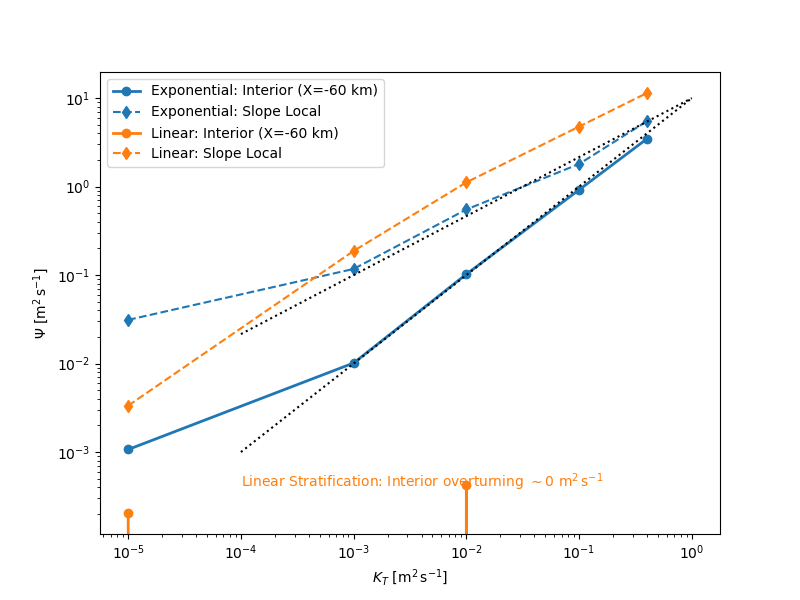

In [197]:
fig, ax = plt.subplots(figsize=(8, 6))

ind = np.where(strat)[0]
ax.plot(K[ind], interior[ind], 'o-', label='Exponential: Interior (X=-60 km)', color='C0', lw=2)
ax.plot(K[ind], maxOT[ind] - interior[ind], 'd--', label='Exponential: Slope Local', color='C0')
ind = np.where(1-strat)[0]
ax.plot(K[ind], interior[ind], 'o-', label='Linear: Interior (X=-60 km)', color='C1', lw=2)
ax.plot(K[ind], maxOT[ind] - interior[ind], 'd--', label='Linear: Slope Local', color='C1')
ax.text(1e-4, 4e-4, r'Linear Stratification: Interior overturning $\sim 0\ \mathrm{m^2\,s^{-1}}$', color='C1')
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend()
ax.set_xlabel(r'$K_T\ \mathrm{[m^2\, s^{-1}]}$')
ax.set_ylabel(r'$\Psi\ \mathrm{[m^2\, s^{-1}]}$')

ax.loglog([1e-4, 1],np.array([1e-4**(2/3), 1**(2/3)])*10, 'k:', label=r'$K_T^{2/3}$')
ax.loglog([1e-4, 1],[1e-3, 10], 'k:', label=r'$K_T^{2/3}$')
jmkfigure.jmksavenb('OTKdep', dpi=300, kinds=['pdf'])

### Plot two examples of these runs:

<>:56: SyntaxWarning: invalid escape sequence '\ '
<>:56: SyntaxWarning: invalid escape sequence '\ '
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_2762/3795689452.py:56: SyntaxWarning: invalid escape sequence '\ '
  cbar.set_label('$\\psi\ (\\mathrm{m^2\\,s^{-1}})$', fontsize='small')  # Set label font size


25.969488869949505
21.536594773064692
Figure(1100x800)


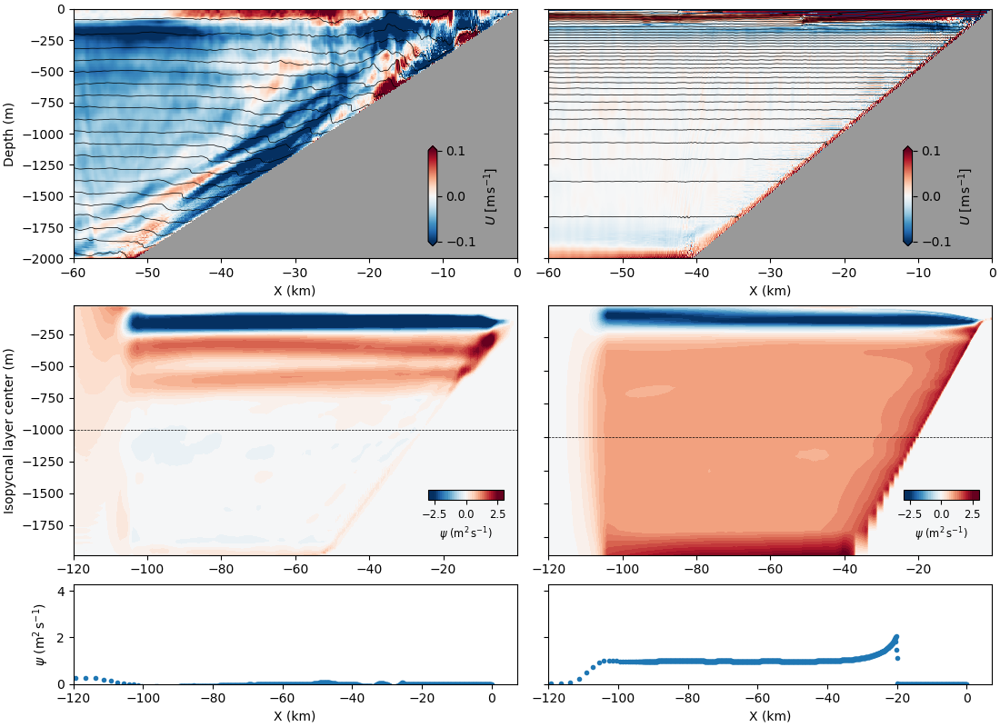

In [32]:
# plot two examples:
clear_cache = False
xlims = [-60, 0]
fig, axs = plt.subplots(3, 2, layout='constrained', height_ratios=[1, 1, 0.4], figsize=(11, 8))
for nn, runname in enumerate(['Slope2D059', 'Slope2D023']):
    with xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['spinup'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as ds0:
        ds = ds0.isel(YC=0, YG=0, time=-1)
        ds['XG'] = (ds['XG'] - ds.XC[-1]) / 1000
        ds['XC'] = (ds['XC'] - ds.XC[-1]) / 1000
        ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
        ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

        theta0 = ds['THETA'].isel(XC=10).values
        z = ds.Z.values
        ax = axs[0, nn]
        pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'], clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
        ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
        cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
        cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$U\ \mathrm{[m\,s^{-1}]}$')
        #ax.set_title(f'{runname} {runs[runname]}', loc='left', fontsize='medium', fontstyle='italic')
        ax.set_xlim(xlims)
        ax.set_facecolor('0.6')
        ax.set_xlabel('X (km)')
        if nn == 0:
            ax.set_ylabel('Depth (m)')
        else:
            ax.set_yticklabels([])

    with xm.open_mdsdataset(f'../results/{runname}/input/', iters='all', endian='<', prefix='layDiag') as ds0:
        # get the isopycnal to evaluate the overturning strength:
        #if runs[runname].split(';')[1] == ' Nexp':
        #    rho0 = 23
        #else:
        #    rho0 =  25.75
        rho0 = 23

        ds0 = ds0.isel(YC=0, YG=0, time=slice(-10, None))
        ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
        ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
        ax = axs[1, nn]
        #pc = ax.pcolormesh(ds0.XG, ds0.layer_1TH_center, ds0.LaUH1TH.mean(dim='time'), cmap='RdBu_r', vmin=-1, vmax=1, rasterized=True)
        cum = ds0.LaUH1TH.cumsum(dim='layer_1TH_center').mean(dim='time')
        zl = np.interp(ds0.layer_1TH_center, theta0[::-1], z[::-1])
        # cs = ax.contourf(ds0.XG, ds0.layer_1TH_center, cum, levels=np.arange(-15, 15, 0.15), vmin=-3, vmax=+3, cmap='RdBu_r')
        cs = ax.contourf(ds0.XG, zl, cum, levels=np.arange(-10, 10, 0.15), vmin=-2.5, vmax=+2.5, cmap='RdBu_r')
        #cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[0.3], colors='r', vmin=-3, vmax=+3, linewidths=2)
        #cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[1], colors='g', vmin=-3, vmax=+3, linewidths=2)
        ax.set_xlim(xmin=-120)
        # ax.clabel(cs, inline=True, fontsize=8)
        cax = ax.inset_axes([0.8, 0.22, 0.17, 0.04])
        cbar = fig.colorbar(cs, cax=cax, orientation='horizontal', shrink=0.8, extend='both')
        cbar.set_label('$\\psi\ (\\mathrm{m^2\\,s^{-1}})$', fontsize='small')  # Set label font size
        cbar.ax.tick_params(labelsize='small')        # Set tick label font size
        cax.set_xlim(-3, 3)
        cax.set_xticks(np.arange(-2.5, 2.6, 2.5))
        ax.set_facecolor('0.6')
        rho0 = np.interp(-1000, z[::-1], theta0[::-1])
        print(rho0)
        ax.axhline(np.interp(rho0, theta0[::-1], z[::-1]), color='k', lw=0.5, ls='--')

        if nn == 0:
            ax.set_ylabel('Isopycnal layer center (m)')
        else:
            ax.set_yticklabels([])


        ax = axs[2, nn]
        ax.plot(ds0.XG, cum.sel(layer_1TH_center=rho0, method='nearest'), '.')
        ax.set_ylim(ymax=4.3, ymin=0.0)
        ax.set_xlim(xmin=-120)
        if nn == 0:
            ax.set_ylabel(r'$\psi\ (\mathrm{m^2\,s^{-1}})$')
        else:
            ax.set_yticklabels([])
        ax.set_xlabel('X (km)')

jmkfigure.jmksavenb(f'OT_Examples', dpi=300, kinds=['pdf'])

<xarray.DataArray 'LaUH1TH' (layer_1TH_center: 100, XG: 960)> Size: 768kB
dask.array<mean_agg-aggregate, shape=(100, 960), dtype=float64, chunksize=(100, 960), chunktype=numpy.ndarray>
Coordinates: (12/13)
    YC                float64 8B 50.0
  * XG                (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
    YG                float64 8B 0.0
    dyG               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    rAz               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    dxC               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    ...                ...
    dxV               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInW           (XG) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    rLowW             (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    dyU               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    rSurfW            (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_center  (layer_1TH_center) float64 800B 20.7 20.78 ... 27.75 27.82

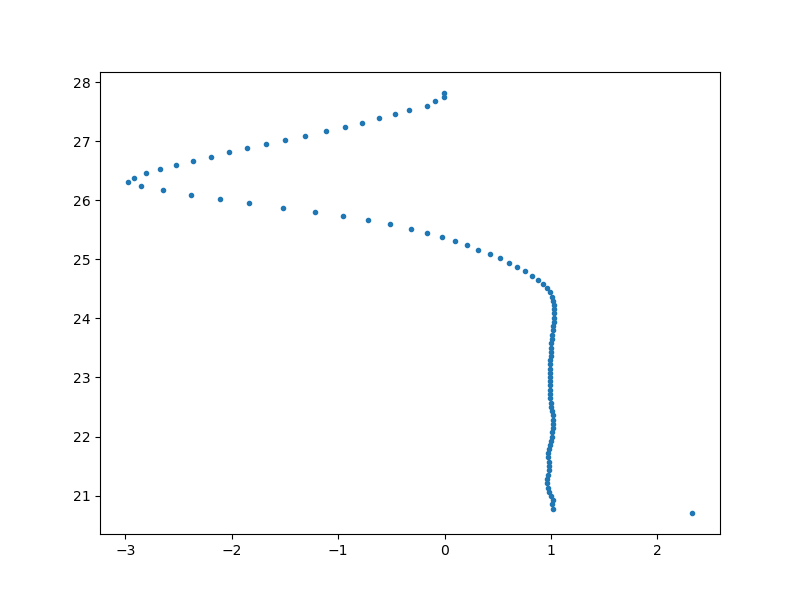

In [ ]:
display(cum)
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(cum.sel(XG=-60, method='nearest'), cum.layer_1TH_center, '.')


<>:61: SyntaxWarning: invalid escape sequence '\ '
<>:61: SyntaxWarning: invalid escape sequence '\ '
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_2762/1526472156.py:61: SyntaxWarning: invalid escape sequence '\ '
  cbar.set_label('$\\psi\ (\\mathrm{m^2\\,s^{-1}})$', fontsize='small')  # Set label font size


25.962904123531608
Figure(570x800)


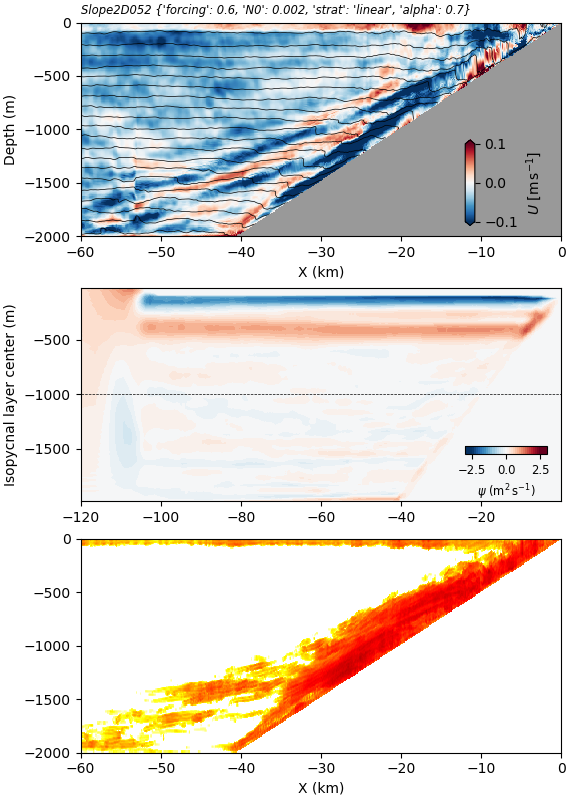

In [195]:
# plot two examples:
clear_cache = False
xlims = [-60, 0]
for nn, runname in enumerate([f'Slope2D{i:03d}' for i in range(52, 53)]):
    try:
        fig.close()
    except:
        pass
    fig, axs = plt.subplots(3, 1, layout='constrained', height_ratios=[1, 1, 1], figsize=(5.7, 8),
                            squeeze=True)
    with xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['spinup'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as ds0:
        ds = ds0.isel(YC=0, YG=0, time=-1)
        ds['XG'] = (ds['XG'] - ds.XC[-1]) / 1000
        ds['XC'] = (ds['XC'] - ds.XC[-1]) / 1000
        ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
        ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

        theta0 = ds['THETA'].isel(XC=10).values
        z = ds.Z.values
        ax = axs[0]
        pc = ax.pcolormesh(ds.XG, ds.Z, ds['UVEL'], clim=[-0.1, 0.1], cmap='RdBu_r', rasterized=True)
        ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
        cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
        cbar = fig.colorbar(pc, cax=cax, orientation='vertical', extend='both', label=r'$U\ \mathrm{[m\,s^{-1}]}$')
        ax.set_title(f'{runname} {forcedruns[runname]}', loc='left', fontsize='small', fontstyle='italic')
        ax.set_xlim(xlims)
        ax.set_facecolor('0.6')
        ax.set_xlabel('X (km)')
        if True:
            ax.set_ylabel('Depth (m)')
        else:
            ax.set_yticklabels([])

    with xm.open_mdsdataset(f'../results/{runname}/input/', iters='all', endian='<', prefix='layDiag') as ds0:
        # get the isopycnal to evaluate the overturning strength:
        #if runs[runname].split(';')[1] == ' Nexp':
        #    rho0 = 23
        #else:
        #    rho0 =  25.75
        rho0 = 23

        ds0 = ds0.isel(YC=0, YG=0, time=slice(-10, None))
        ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
        ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
        ax = axs[1]
        #pc = ax.pcolormesh(ds0.XG, ds0.layer_1TH_center, ds0.LaUH1TH.mean(dim='time'), cmap='RdBu_r', vmin=-1, vmax=1, rasterized=True)
        cum = ds0.LaUH1TH.cumsum(dim='layer_1TH_center').mean(dim='time')
        zl = np.interp(ds0.layer_1TH_center, theta0[::-1], z[::-1])
        # cs = ax.contourf(ds0.XG, ds0.layer_1TH_center, cum, levels=np.arange(-15, 15, 0.15), vmin=-3, vmax=+3, cmap='RdBu_r')
        cs = ax.contourf(ds0.XG, zl, cum, levels=np.arange(-10, 10, 0.15), vmin=-2.5, vmax=+2.5, cmap='RdBu_r')
        #cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[0.3], colors='r', vmin=-3, vmax=+3, linewidths=2)
        #cs = ax.contour(ds0.XG, ds0.layer_1TH_center, cum, levels=[1], colors='g', vmin=-3, vmax=+3, linewidths=2)
        ax.set_xlim(xmin=-120)
        # ax.clabel(cs, inline=True, fontsize=8)
        cax = ax.inset_axes([0.8, 0.22, 0.17, 0.04])
        cbar = fig.colorbar(cs, cax=cax, orientation='horizontal', shrink=0.8, extend='both')
        cbar.set_label('$\\psi\ (\\mathrm{m^2\\,s^{-1}})$', fontsize='small')  # Set label font size
        cbar.ax.tick_params(labelsize='small')        # Set tick label font size
        cax.set_xlim(-3, 3)
        cax.set_xticks(np.arange(-2.5, 2.6, 2.5))
        ax.set_facecolor('0.6')
        rho0 = np.interp(-1000, z[::-1], theta0[::-1])
        print(rho0)
        ax.axhline(np.interp(rho0, theta0[::-1], z[::-1]), color='k', lw=0.5, ls='--')

        if True:
            ax.set_ylabel('Isopycnal layer center (m)')
        else:
            ax.set_yticklabels([])

    with xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['dissipation'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as dsdiss0:
        ax = axs[2]
        dsdiss = dsdiss0.isel(YC=0, YG=0, time=slice(-(10*12), None)).mean(dim='time')
        dsdiss['KLviscAr'] = dsdiss['KLviscAr'].where(ds['THETA'].values > 0)
        dsdiss['XG'] = (dsdiss.XG - dsdiss.XC[-1]) / 1e3
        dsdiss['XC'] = (dsdiss.XC - dsdiss.XC[-1]) / 1e3


        ax.pcolormesh(dsdiss.XG, dsdiss.Z, dsdiss['KLviscAr'], cmap='hot_r', rasterized=True,
                      norm=mcolors.LogNorm(vmin=1e-5, vmax=1e-0), zorder=1)
        # ax.contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5, zorder=10)
        ax.set_xlim(xmin=-60)

        ax.set_xlabel('X (km)')

    jmkfigure.jmksavenb(f'OT_plot_{runname}', dpi=300, kinds=['pdf'])


#### Plot some example time series

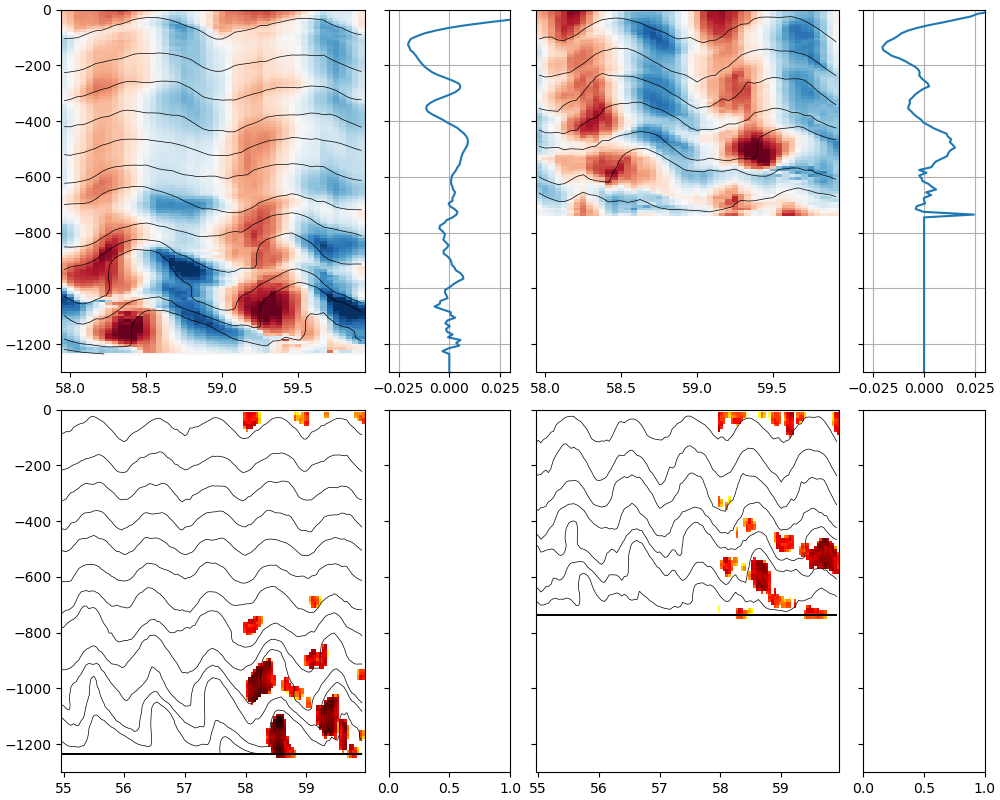

In [198]:
runname = 'Slope2D052'
poss = [-25, -15]
dt = np.timedelta64(int(3600.00*12.4), 's')
with (xm.open_mdsdataset(f'../results/{runname}/input/', prefix=['spinup'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache) as ds0,
                                    xm.open_mdsdataset(f'../results/{runname}/input/', prefix=['dissipation'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache) as dsdiss0):
    ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
    ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
    dsdiss0['XG'] = (dsdiss0.XG - dsdiss0.XC[-1]) / 1e3
    dsdiss0['XC'] = (dsdiss0.XC - dsdiss0.XC[-1]) / 1e3
    fig, axs = plt.subplots(2, 4, layout='constrained', figsize=(10, 8), width_ratios=[1, 0.4, 1, 0.4], sharey=True)
    for nn, pos in enumerate(poss):
        ax = axs[0, 2*nn]
        ds = ds0.isel(YC=0, YG=0, time=slice(-49, -1)).sel(XG=pos, XC=pos, method='nearest')

        ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
        ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)
        ax.pcolormesh(ds.time / dt, ds.Z, ds.UVEL.T, cmap='RdBu_r', shading='nearest', rasterized=True, vmin=-0.2, vmax=0.2)
        ax.contour(ds.time / dt, ds.Z, ds.THETA.T, levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
        ax.set_ylim(ymin=-1300)

        ds = ds0.isel(YC=0, YG=0, time=slice(-24*5-1, -1)).sel(XG=pos, XC=pos, method='nearest')
        ax = axs[0, 2*nn+1]
        ax.plot(ds.UVEL[1:, :].mean(dim='time'), ds.Z)
        ax.set_xlim([-0.03, 0.03])
        ax.grid('on')

        ax = axs[1, 2*nn]
        dsdiss = dsdiss0.isel(YC=0, YG=0, time=slice(-49, -1)).sel(XG=pos, XC=pos, method='nearest')
        # dsdiss['KLviscAr'] = dsdiss['KLviscAr'].where(ds['THETA'].values > 0)
        pc = ax.pcolormesh(dsdiss.time / dt, dsdiss.Z, dsdiss['KLviscAr'].T, cmap='hot_r', rasterized=True,
                           norm=mcolors.LogNorm(vmin=1e-5, vmax=1e-0))
        ax.contour(ds.time / dt, ds.Z, ds.THETA.T, levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)

        #cax = ax.inset_axes([0.8, 0.05, 0.02, 0.4])
        #fig.colorbar(pc, cax=cax, label=r'$K_{L,\mathrm{visc}}$', orientation='vertical',
        #             ticks=[1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])

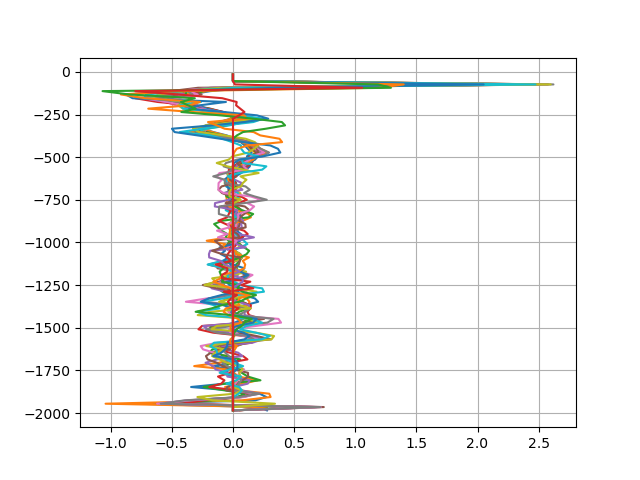

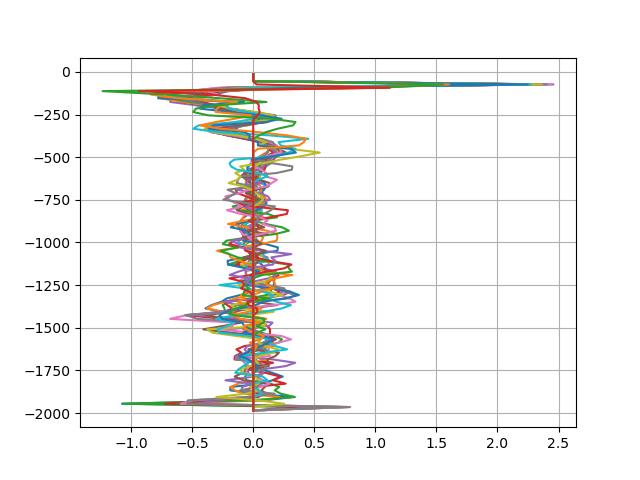

In [199]:
ppos = np.arange(-60, 0, 2.5)
runname = 'Slope2D052'
with xm.open_mdsdataset(f'../results/{runname}/input/', prefix=['layDiag'], geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache) as ds_lay:
    theta0 = ds0['THETA'].isel(time=0, XC=10).values.flatten()
    z = ds0['Z'].values
    zl = np.interp(ds_lay.layer_1TH_center.values, theta0[::-1], z[::-1])

    ds_lay['XG'] = (ds_lay.XG - ds_lay.XC[-1]) / 1e3
    ds_lay['XC'] = (ds_lay.XC - ds_lay.XC[-1]) / 1e3
    fig, ax = plt.subplots()
    for pos in ppos:
        dss = ds_lay.isel(YC=0, YG=0, time=slice(-10, -4)).sel(XG=pos, XC=pos, method='nearest')
        ax.plot((dss.LaUH1TH).mean(dim='time'), zl, '-')
        #ax.plot(dss.LaUH1TH.mean(dim='time').cumsum(dim='layer_1TH_center'), dss.layer_1TH_center, '-')
        ax.grid(True)
    fig, ax = plt.subplots()
    for pos in ppos:
        dss = ds_lay.isel(YC=0, YG=0, time=slice(-4, None)).sel(XG=pos, XC=pos, method='nearest')
        ax.plot((dss.LaUH1TH).mean(dim='time'), zl, '-')
        #ax.plot(dss.LaUH1TH.mean(dim='time').cumsum(dim='layer_1TH_center'), dss.layer_1TH_center, '-')
        ax.grid(True)


Slope2D052


<xarray.Dataset> Size: 119kB
Dimensions:              (Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99, time: 60)
Coordinates: (12/46)
    XC                   float64 8B -30.0
    YC                   float64 8B 50.0
    XG                   float64 8B -29.95
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    dyF                  float64 8B dask.array<chunksize=(), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.92 23.96 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.96 24.0 ... 27.94
    iter                 (time) int64 480B dask.array<chunksize=(1,), meta=np.ndarray>
  * time                 (time) timedelta64[ns] 480B 0 days 12:24:00 ... 31 d...
Data variables:
    LaUH1TH              (time, layer_1TH_center) float64 48kB dask.array<chunksize=(1, 100), meta=np.ndarray>
    LaHw1TH              (time, layer_1TH_center) float64 48kB dask.array<chunksize=(1, 100), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='../results/Sl...

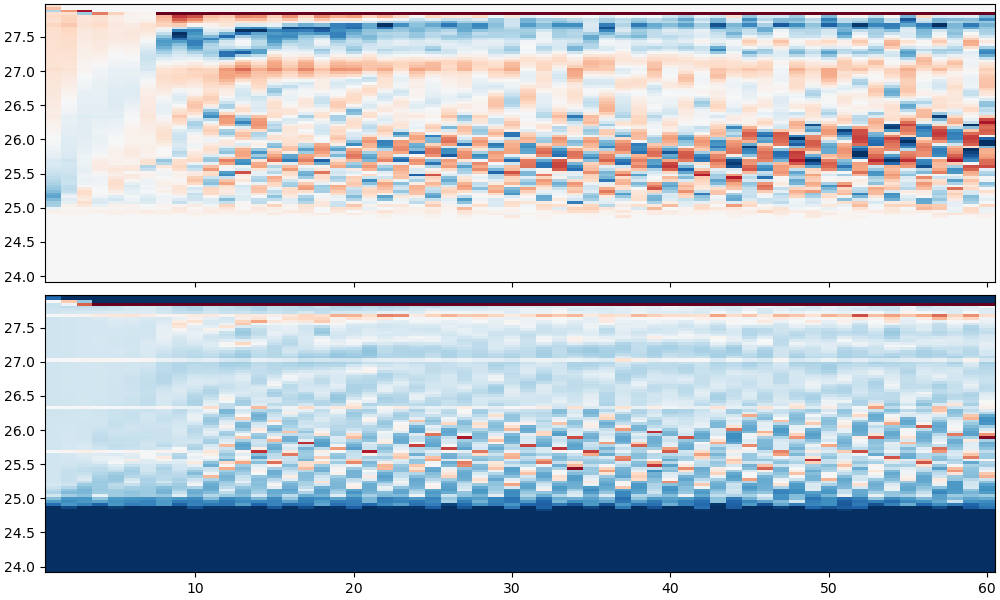

In [196]:
# Are the layers in steady state?
pos = -30
runname = 'Slope2D052'
print(runname)
with xm.open_mdsdataset(f'../results/{runname}/input/', prefix=['layDiag'], geometry='cartesian', endian='<', iters='all', clear_cache=clear_cache) as ds_lay:
    ds_lay = ds_lay.isel(YC=0, YG=0)
    ds_lay['XG'] = (ds_lay.XG - ds_lay.XC[-1]) / 1e3
    ds_lay['XC'] = (ds_lay.XC - ds_lay.XC[-1]) / 1e3
    ds = ds_lay.sel(XG=pos, XC=pos, method='nearest')
    display(ds)
    fig, ax = plt.subplots(2, 1, sharex=True, sharey=True, layout='constrained', figsize=(10, 6))
    ax[0].pcolormesh(ds.time/dt, ds.layer_1TH_center, ds.LaUH1TH.T, cmap='RdBu_r', shading='nearest', rasterized=True, vmin=-1, vmax=1)
    ax[1].pcolormesh(ds.time/dt, ds.layer_1TH_center, ds.LaHw1TH.T, cmap='RdBu_r', shading='nearest', rasterized=True, vmin=0, vmax=50)

## Get the buoyancy flux.

$$\mathbf{J_b} = -\kappa \nabla \rho$$

In [ ]:
with xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=clear_cache
                                ) as ds0:
    ds0['XG'] = (ds0['XG'] - ds0.XC[-1])
    ds0['XC'] = (ds0['XC'] - ds0.XC[-1])
    ds = ds0.isel(YC=0, YG=0, time=slice(-5, None)).mean(dim='time')
    ds['UVEL'] = ds['UVEL'].where(ds['THETA'].values > 0)
    ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
    ds['THETA'] = ds['THETA'].where(ds['THETA'].values > 0)

    ds['drhodx'] = ds.THETA.differentiate(coord='XC') * -0.2
    ds['drhodz'] = ds.THETA.differentiate(coord='Z') * -0.2
    display(ds)

<xarray.Dataset> Size: 25MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/44)
  * XC                   (XC) float64 8kB -1.437e+05 -1.381e+05 ... -100.0 0.0
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB -1.466e+05 -1.407e+05 ... -150.0 -50.0
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    rSurfW               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInS              (XC) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.92 23.96 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.96 24.0 ... 27.94
Data variables: (12/13)
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    ...                   ...
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    drhodx               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    drhodz               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:25: SyntaxWarning: invalid escape sequence '\ '
<>:26: SyntaxWarning: invalid escape sequence '\ '
<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:25: SyntaxWarning: invalid escape sequence '\ '
<>:26: SyntaxWarning: invalid escape sequence '\ '
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1822683934.py:4: SyntaxWarning: invalid escape sequence '\s'
  fig.colorbar(pc, label='$10^3 \\left| \\nabla \\rho \\right| \sim \\left|\mathbf{J_b}\\right|$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1822683934.py:25: SyntaxWarning: invalid escape sequence '\ '
  ax.set_xlabel('$X^*\ [m]$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1822683934.py:26: SyntaxWarning: invalid escape sequence '\ '
  axs[0].set_ylabel('$Z^*\ [m]$')


Figure(575x600)


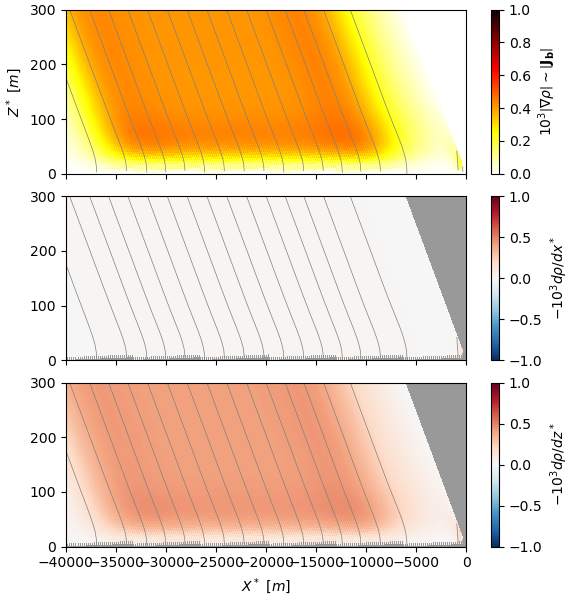

In [ ]:
fig, axs = plt.subplots(3, 1, layout='constrained', figsize=(5.75, 6), sharex=True, sharey=True)
ax = axs[0]
pc = ax.pcolormesh(np.real(AA), np.imag(AA), 1000*np.sqrt(ds.drhodz**2+ds.drhodx**2), cmap='hot_r', rasterized=True, clim=[0, 1])
fig.colorbar(pc, label='$10^3 \\left| \\nabla \\rho \\right| \sim \\left|\mathbf{J_b}\\right|$')
ax.contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)

ax = axs[1]

gradrho = ds.drhodx + 1j*ds.drhodz
gradrho = gradrho*np.exp(-1j*ang)

pc = ax.pcolormesh(np.real(AA), np.imag(AA), -1000*np.real(gradrho), cmap='RdBu_r', rasterized=True, clim=[-1, 1])
fig.colorbar(pc, label='$-10^3 d\\rho/dx^*$')
ax.set_facecolor('0.6')
ax.contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)

ax = axs[2]

pc = ax.pcolormesh(np.real(AA), np.imag(AA), -1000*np.imag(gradrho), cmap='RdBu_r', rasterized=True, clim=[-1, 1])
fig.colorbar(pc, label='$-10^3 d\\rho/dz^*$')
ax.set_ylim([0, 300])
ax.set_xlim([-40000, 0])
ax.set_facecolor('0.6')
ax.contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
ax.set_xlabel('$X^*\ [m]$')
axs[0].set_ylabel('$Z^*\ [m]$')

jmkfigure.jmksavenb('Slope2D004_slopeBuoyancy', dpi=300, kinds=['pdf'])


<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:26: SyntaxWarning: invalid escape sequence '\ '
<>:27: SyntaxWarning: invalid escape sequence '\ '
<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:26: SyntaxWarning: invalid escape sequence '\ '
<>:27: SyntaxWarning: invalid escape sequence '\ '
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1066592183.py:4: SyntaxWarning: invalid escape sequence '\s'
  fig.colorbar(pc, label='$10^3 \\left| \\nabla \\rho \\right| \sim \\left|\mathbf{J_b}\\right|$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1066592183.py:26: SyntaxWarning: invalid escape sequence '\ '
  ax.set_xlabel('$X^*\ [m]$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_68751/1066592183.py:27: SyntaxWarning: invalid escape sequence '\ '
  axs[0].set_ylabel('$Z^*\ [m]$')


NameError: name 'dsadsa' is not defined

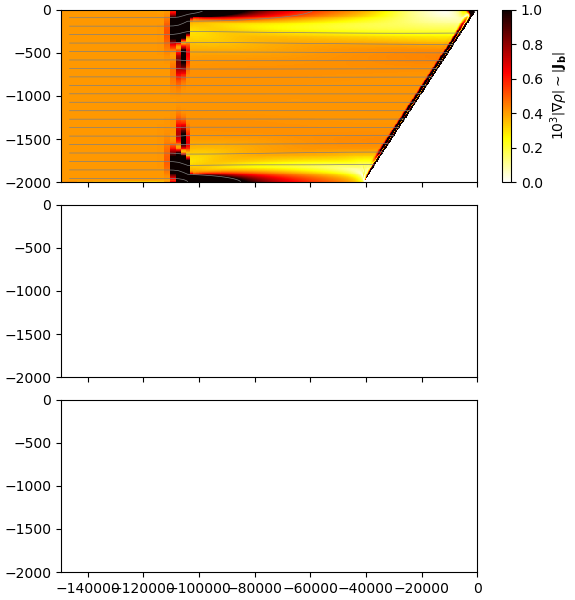

In [ ]:
fig, axs = plt.subplots(3, 1, layout='constrained', figsize=(5.75, 6), sharex=True, sharey=True)
ax = axs[0]
pc = ax.pcolormesh(X, Z, 1000*np.sqrt(ds.drhodz**2+ds.drhodx**2), cmap='hot_r', rasterized=True, clim=[0, 1])
fig.colorbar(pc, label='$10^3 \\left| \\nabla \\rho \\right| \sim \\left|\mathbf{J_b}\\right|$')
ax.contour(X, Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)

dsadsa
ax = axs[1]

gradrho = ds.drhodx + 1j*ds.drhodz
gradrho = gradrho*np.exp(-1j*ang)

pc = ax.pcolormesh(np.real(AA), np.imag(AA), -1000*np.real(gradrho), cmap='RdBu_r', rasterized=True, clim=[-1, 1])
fig.colorbar(pc, label='$-10^3 d\\rho/dx^*$')
ax.set_facecolor('0.6')
ax.contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)

ax = axs[2]

pc = ax.pcolormesh(np.real(AA), np.imag(AA), -1000*np.imag(gradrho), cmap='RdBu_r', rasterized=True, clim=[-1, 1])
fig.colorbar(pc, label='$-10^3 d\\rho/dz^*$')
ax.set_ylim([0, 300])
ax.set_xlim([-40000, 0])
ax.set_facecolor('0.6')
ax.contour(np.real(AA), np.imag(AA), ds['THETA'], levels=np.arange(20, 28, 0.2), colors='0.5', linewidths=0.5)
ax.set_xlabel('$X^*\ [m]$')
axs[0].set_ylabel('$Z^*\ [m]$')

jmkfigure.jmksavenb('Slope2D004_slopeBuoyancy', dpi=300, kinds=['pdf'])


## Plot buoyancy flux for unforced runs

<>:29: SyntaxWarning: invalid escape sequence '\ '
<>:33: SyntaxWarning: invalid escape sequence '\ '
<>:36: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\ '
<>:33: SyntaxWarning: invalid escape sequence '\ '
<>:36: SyntaxWarning: invalid escape sequence '\m'
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/3777348486.py:29: SyntaxWarning: invalid escape sequence '\ '
  fig.colorbar(pc, ax=ax[0], label='$J_{bz}\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/3777348486.py:33: SyntaxWarning: invalid escape sequence '\ '
  fig.colorbar(pc, ax=ax[1], label='$W\ \mathrm{[m/s]}$', orientation='vertical', shrink=0.8, extend='both')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/3777348486.py:36: SyntaxWarning: invalid escape sequence '\m'
  fig.colorbar(pc, ax=ax[2], label='$|\mathbf{J_{b}}|\ \mathrm{[m^2/s^{-3}]}$', ori

Figure(800x800)


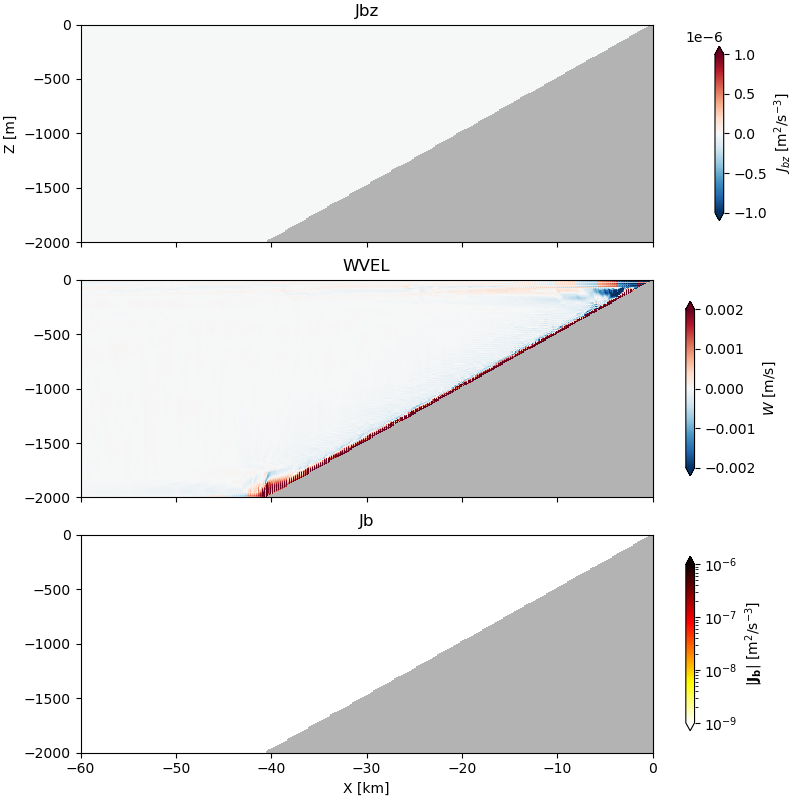

In [10]:
runname = 'Slope2D023'
with (xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=False
                                ) as ds0,
        xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=False
                                ) as dsdiss):
    ds = ds0.isel(YC=0, YG=0, time=slice(-5, None)).mean(dim='time')
    dsdiss = dsdiss.isel(YC=0, YG=0, time=slice(-5, None)).mean(dim='time')
    ds['KLviscAr'] = dsdiss['KLviscAr'].where(ds['THETA'].values > 0)
    ds['WVEL'] = ds['WVEL'].where(ds['THETA'].values > 0)

    ds['XG'] = (ds['XG'] - ds.XC[-1]) / 1000
    ds['XC'] = (ds['XC'] - ds.XC[-1]) / 1000
    ds['pden'] = ds['THETA'] * -0.2
    ds['pden'] = ds['pden'].where(ds['THETA'].values > 0)
    ds['drhodx'] = ds.pden.differentiate(coord='XC')/1000
    ds['drhodz'] = ds.pden.differentiate(coord='Z')
    ds['Jbz'] = ds.drhodz * ds.KLviscAr.values / 1000 * 9.8  # convert to m^2/s^3
    ds['Jbx'] = ds.drhodx * ds.KLviscAr.values / 1000 * 9.8
    ds['Jb'] = np.sqrt(ds.Jbz**2 + ds.Jbx**2)

    fig, ax = plt.subplots(3, 1, figsize=(8, 8), layout='constrained', sharex=True, sharey=True, subplot_kw={'facecolor': '0.7'})
    pc = ax[0].pcolormesh(ds.XG, ds.Z, ds.Jbz, cmap='RdBu_r', rasterized=True, vmin=-1e-6, vmax=1e-6)
    fig.colorbar(pc, ax=ax[0], label='$J_{bz}\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
    ax[0].set_title('Jbz')
    pc = ax[1].pcolormesh(ds.XG, ds.Z, ds.WVEL.rolling(XC=3).mean(), cmap='RdBu_r', rasterized=True, vmin=-2e-3, vmax=2e-3)
    ax[1].set_title('WVEL')
    fig.colorbar(pc, ax=ax[1], label='$W\ \mathrm{[m/s]}$', orientation='vertical', shrink=0.8, extend='both')

    pc = ax[2].pcolormesh(ds.XG, ds.Z, ds.Jb, cmap='hot_r', rasterized=True, norm=mcolors.LogNorm(vmin=1e-9, vmax=1e-6))
    fig.colorbar(pc, ax=ax[2], label='$|\mathbf{J_{b}}|\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
    ax[2].set_title('Jb')
    ax[2].set_xlabel('X [km]')
    ax[0].set_ylabel('Z [m]')
    ax[0].set_xlim([-60, 0])
    jmkfigure.jmksavenb(f'Slope2D011_Jb', dpi=300, kinds=['pdf'])


<>:38: SyntaxWarning: invalid escape sequence '\ '
<>:45: SyntaxWarning: invalid escape sequence '\ '
<>:48: SyntaxWarning: invalid escape sequence '\m'
<>:38: SyntaxWarning: invalid escape sequence '\ '
<>:45: SyntaxWarning: invalid escape sequence '\ '
<>:48: SyntaxWarning: invalid escape sequence '\m'
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/1707043910.py:38: SyntaxWarning: invalid escape sequence '\ '
  fig.colorbar(pc, ax=ax[0], label='$J_{bz}\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/1707043910.py:45: SyntaxWarning: invalid escape sequence '\ '
  fig.colorbar(pc, ax=ax[1], label='$W\ \mathrm{[m/s]}$', orientation='vertical', shrink=0.8, extend='both')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_22108/1707043910.py:48: SyntaxWarning: invalid escape sequence '\m'
  fig.colorbar(pc, ax=ax[2], label='$|\mathbf{J_{b}}|\ \mathrm{[m^2/s^{-3}]}$', ori

<xarray.Dataset> Size: 22MB
Dimensions:              (XC: 960, XG: 960, Z: 200, Zp1: 201, Zu: 200, Zl: 200,
                          layer_1TH_bounds: 101, layer_1TH_center: 100,
                          layer_1TH_interface: 99)
Coordinates: (12/44)
  * XC                   (XC) float64 8kB 2.957e+03 8.554e+03 ... 1.466e+05
    YC                   float64 8B 50.0
  * XG                   (XG) float64 8kB 0.0 5.914e+03 ... 1.465e+05 1.466e+05
    YG                   float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    rSurfW               (XG) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
    maskInS              (XC) bool 960B dask.array<chunksize=(960,), meta=np.ndarray>
    dyF                  (XC) float64 8kB dask.array<chunksize=(960,), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 20.67 20.74 ... 27.85
  * layer_1TH_center     (layer_1TH_center) float64 800B 20.7 20.78 ... 27.82
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 20.74 ... 27.78
Data variables:
    UVEL                 (Z, XG) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    VVEL                 (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    WVEL                 (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    THETA                (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    PHIHYD               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC01               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC02               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC03               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    TRAC04               (Z, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLeps                (Zl, XC) float64 2MB dask.array<chunksize=(200, 960), meta=np.ndarray>
    KLviscAr             (Zl, XC) float64 2MB 1e-05 1e-05 1e-05 ... nan nan nan

<xarray.DataArray 'Jbz' (Z: 200)> Size: 2kB
dask.array<sum-aggregate, shape=(200,), dtype=float64, chunksize=(200,), chunktype=numpy.ndarray>
Coordinates:
    YC       float64 8B 50.0
    YG       float64 8B 0.0
  * Z        (Z) float64 2kB -5.0 -15.0 -25.0 ... -1.985e+03 -1.995e+03
    drF      (Z) float64 2kB dask.array<chunksize=(200,), meta=np.ndarray>
    PHrefC   (Z) float64 2kB dask.array<chunksize=(200,), meta=np.ndarray>
    rhoRef   (Z) float64 2kB dask.array<chunksize=(200,), meta=np.ndarray>

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan]
Figure(800x800)
Figure(800x800)


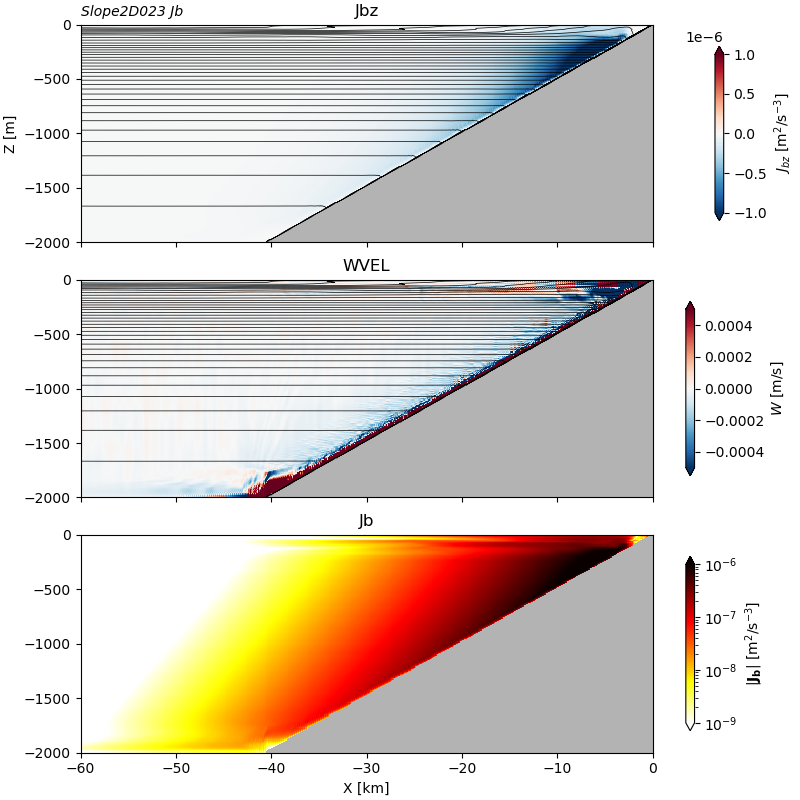

In [12]:
runname = 'Slope2D023'
with (xm.open_mdsdataset(f'../results/{runname}/input/',
                                prefix=['tideave'],
                                geometry='cartesian', endian='<',
                                iters='all', clear_cache=False
                                ) as ds0):
    ds = ds0.isel(YC=0, YG=0, time=slice(-5,None)).mean(dim='time')
    try:
        Kr = np.fromfile(f'../results/{runname}/indata/Kr.bin', dtype=np.float64).reshape(ds.KLviscAr.shape)
        ds['KLviscAr'] = (('Zl', 'XC'), Kr)
        ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
    except FileNotFoundError:
        print('No Kr file found, using constant value')
        ds['KLviscAr'] = 0*ds['KLviscAr'] + 1e-2
    #with fopen('../results/{runname}/indata/Kr.bin', 'r') as f:


    #dsdiss = dsdiss.isel(YC=0, YG=0, time=slice(-5, None)).mean(dim='time')
    display(ds)
    ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
    ds['WVEL'] = ds['WVEL'].where(ds['THETA'].values > 0)

    ds['XG'] = (ds['XG'] - ds.XC[-1]) / 1000
    ds['XC'] = (ds['XC'] - ds.XC[-1]) / 1000
    ds['pden'] = ds['THETA'] * -0.2
    ds['pden'] = ds['pden'].where(ds['THETA'].values > 0)
    ds['drhodx'] = ds.pden.differentiate(coord='XC')/1000
    ds['drhodz'] = ds.pden.differentiate(coord='Z')
    ds['Jbz'] = ds.drhodz * ds.KLviscAr.values / 1000 * 9.8  # convert to m^2/s^3
    ds['Jbx'] = ds.drhodx * ds.KLviscAr.values / 1000 * 9.8
    ds['Jb'] = np.sqrt(ds.Jbz**2 + ds.Jbx**2)
    display(ds.Jbz.integrate(coord='XC'))
    print(ds.Jbz.integrate(coord='XC').values)

    fig, ax = plt.subplots(3, 1, figsize=(8, 8), layout='constrained', sharex=True, sharey=True, subplot_kw={'facecolor': '0.7'})
    pc = ax[0].pcolormesh(ds.XG, ds.Z, ds.Jbz, cmap='RdBu_r', rasterized=True, vmin=-1e-6, vmax=1e-6)
    ax[0].contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
    fig.colorbar(pc, ax=ax[0], label='$J_{bz}\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
    ax[0].set_title('Jbz')

    ax[1].contour(ds.XC, ds.Z, ds['THETA'], levels=np.arange(20, 28, 0.2), colors='k', linewidths=0.5)
    pc = ax[1].pcolormesh(ds.XG, ds.Z, ds.WVEL.rolling(XC=3).mean(), cmap='RdBu_r', rasterized=True, vmin=-0.5e-3, vmax=0.5e-3)
    ax[1].set_title('WVEL')

    fig.colorbar(pc, ax=ax[1], label='$W\ \mathrm{[m/s]}$', orientation='vertical', shrink=0.8, extend='both')

    pc = ax[2].pcolormesh(ds.XG, ds.Z, ds.Jb, cmap='hot_r', rasterized=True, norm=mcolors.LogNorm(vmin=1e-9, vmax=1e-6))
    fig.colorbar(pc, ax=ax[2], label='$|\mathbf{J_{b}}|\ \mathrm{[m^2/s^{-3}]}$', orientation='vertical', shrink=0.8, extend='both')
    ax[2].set_title('Jb')
    ax[2].set_xlabel('X [km]')
    ax[0].set_ylabel('Z [m]')
    ax[0].set_title(f'{runname} Jb', loc='left', fontsize='medium', fontstyle='italic')
    #ax[0].set_xlim([-60, 0])
    jmkfigure.jmksavenb(f'{runname}_Jb', dpi=300, kinds=['pdf'])
    if True:
        ax[0].set_xlim([-60, 0])
        jmkfigure.jmksavenb(f'{runname}_slope_Jb', dpi=300, kinds=['pdf'])
    if False:
        ax[0].set_xlim([-22, -20])
        ax[0].set_ylim([-1100, -750])
        jmkfigure.jmksavenb(f'{runname}_zoom_Jb', dpi=300, kinds=['pdf'])



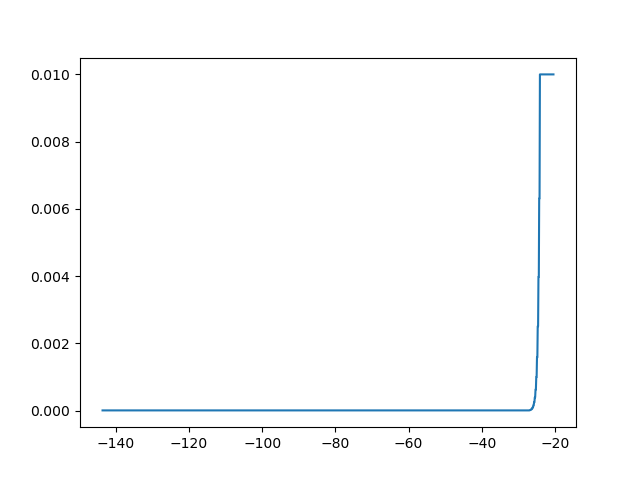

In [ ]:
fig, ax = plt.subplots()
#ax.pcolormesh(ds.XG, ds.Z, ds.Jbz, cmap='RdBu_r', rasterized=True, vmin=-1e-6, vmax=1e-6)
ax.plot(ds.XC, ds.KLviscAr[100,:])

<>:29: SyntaxWarning: invalid escape sequence '\i'
<>:36: SyntaxWarning: invalid escape sequence '\i'
<>:29: SyntaxWarning: invalid escape sequence '\i'
<>:36: SyntaxWarning: invalid escape sequence '\i'
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_67995/1445856092.py:29: SyntaxWarning: invalid escape sequence '\i'
  ax.set_xlabel('$\int{J_{bz}}\,\mathrm{d}x\ \  \mathrm{[m^3/s^3]}$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_67995/1445856092.py:36: SyntaxWarning: invalid escape sequence '\i'
  ax.set_xlabel('$\int{w}\,\mathrm{d}x\ \  \mathrm{[m^2/s]}$')


Figure(600x400)


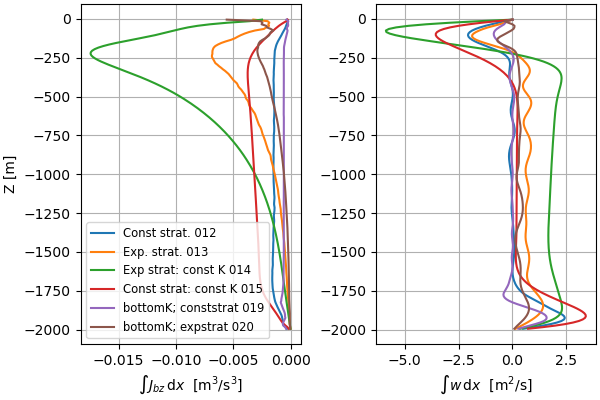

In [ ]:

fig, axs = plt.subplots(1, 2, layout='constrained', figsize=(6, 4))
for runname, label in zip(['Slope2D012', 'Slope2D013', 'Slope2D014', 'Slope2D015', 'Slope2D019', 'Slope2D020'], ['Const strat.', 'Exp. strat.', 'Exp strat: const K', 'Const strat: const K', 'bottomK; conststrat', 'bottomK; expstrat']):
    with (xm.open_mdsdataset(f'../results/{runname}/input/',
                                    prefix=['tideave'],
                                    geometry='cartesian', endian='<',
                                    iters='all', clear_cache=clear_cache
                                    ) as ds0):
        ds = ds0.isel(YC=0, YG=0, time=slice(-2, None)).mean(dim='time')
        try:
            Kr = np.fromfile(f'../results/{runname}/indata/Kr.bin', dtype=np.float64).reshape(ds.KLviscAr.shape)
            ds['KLviscAr'] = (('Zl', 'XC'), Kr)
            ds['KLviscAr'] = ds['KLviscAr'].where(ds['THETA'].values > 0)
        except FileNotFoundError:
            ds['KLviscAr'] = 1e-2
        ds['WVEL'] = ds['WVEL'].where(ds['THETA'].values > 0)

        ds['XG'] = (ds['XG'] - ds.XC[-1])
        ds['XC'] = (ds['XC'] - ds.XC[-1])
        ds['pden'] = ds['THETA'] * -0.2
        ds['pden'] = ds['pden'].where(ds['THETA'].values > 0)
        ds['drhodx'] = ds.pden.differentiate(coord='XC')/1000
        ds['drhodz'] = ds.pden.differentiate(coord='Z')
        ds['Jbz'] = ds.drhodz * ds.KLviscAr.values / 1000 * 9.8  # convert to m^2/s^3
        ds['Jbx'] = ds.drhodx * ds.KLviscAr.values / 1000 * 9.8
        ds['Jb'] = np.sqrt(ds.Jbz**2 + ds.Jbx**2)
        ax = axs[0]
        ax.plot(ds.Jbz.fillna(0).sel(XC=slice(-80e3,None)).integrate(coord='XC'), ds.Z, label=label+' ' + runname[-3:])
        ax.set_xlabel('$\int{J_{bz}}\,\mathrm{d}x\ \  \mathrm{[m^3/s^3]}$')
        ax.grid(True)
        ax.set_ylabel('Z [m]')

        ax = axs[1]
        ax.plot(ds.WVEL.fillna(0).sel(XC=slice(-80e3,None)).integrate(coord='XC',), ds.Z, label='Jbz')
        ax.grid(True)
        ax.set_xlabel('$\int{w}\,\mathrm{d}x\ \  \mathrm{[m^2/s]}$')
    axs[0].legend(loc='lower left', fontsize='small')
jmkfigure.jmksavenb('Slope2d_12_13_summedJb', dpi=300, kinds=['pdf'])


# Get Epsilon by density class, using xhist

Match up to w in the layers and then see how dEpsilon/dz looks.  

In [228]:
runname = 'Slope2D010'
iters = list(np.arange(29*12.4*3600, 30*12.4*3600, 12.4*3600/24))
iters = [int(it) for it in iters]
print(iters)

with (xm.open_mdsdataset(f'../results/{runname}/input/',
                           prefix=['dissipation'], geometry='cartesian', endian='<',
                           iters='all', clear_cache=False
                           ) as dsdiss0,
      xm.open_mdsdataset(f'../results/{runname}/input/',
                           prefix=['spinup'], geometry='cartesian', endian='<',
                           iters='all', clear_cache=False
                           ) as ds0,
        xm.open_mdsdataset(f'../results/{runname}/input/',
                           prefix=['layDiag'], geometry='cartesian', endian='<',
                           iters='all', clear_cache=False
                           ) as dslayer):

    ds0 = ds0.isel(YC=0, YG=0, time = slice(-24*5, None))
    ds0['XG'] = (ds0.XG - ds0.XC[-1]) / 1e3
    ds0['XC'] = (ds0.XC - ds0.XC[-1]) / 1e3
    dslayer['XG'] = (dslayer.XG - dslayer.XC[-1]) / 1e3
    dsdiss0 = dsdiss0.isel(YC=0, YG=0, time = slice(-24*5, None))
    dsdiss0['XG'] = (dsdiss0.XG - dsdiss0.XC[-1]) / 1e3
    dsdiss0['XC'] = (dsdiss0.XC - dsdiss0.XC[-1]) / 1e3

    theta0 = ds0.THETA.isel(time=0)   # one snapshot, dims: Z, Y, X (etc.)
    wet0 = theta0 != 0

    below_wet0 = wet0.shift(Z=1, fill_value=False)
    bottom_wet0 = wet0 & (~below_wet0)   # bottommost wet cell in each column

    LayerTh = dslayer.layer_1TH_bounds.values
    ds0['KLeps'] = (('time', 'Z', 'XC'), dsdiss0['KLeps'].values)

    # 1) cell-centered drho/dz
    # (your -0.2 is likely alpha*rho0 or similar; keep as-is if that's your EOS linearization)
    ds0["drhodz"] = ds0.THETA.differentiate("Z") * (-0.2)

    K = ds0["KLeps"]
    Kf = 0.5 * (K.shift(Z=-1) + K)          # lives on "upper" faces; last face is NaN
    # optional: fill the last face from a BC or copy:
    # Kf = Kf.fillna(Kf.isel(Z=-2))

    ds0["Kf"] = Kf

    # 3) put drhodz on faces consistently from rho itself:
    rho = ds0["THETA"] * (-0.2)  # or ds0["rho"] if you already have rho; this line just matches your scaling
    drhodz_f = (rho.shift(Z=-1) - rho) / (rho["Z"].shift(Z=-1) - rho["Z"])
    ds0["drhodz_f"] = drhodz_f

    # 4) face flux F = Kf * (drho/dz)_f
    F = ds0["Kf"] * ds0["drhodz_f"]
    ds0["F"] = F

    # 5) divergence back to cell centers:
    dz = float(ds0["Z"].diff("Z").mean())   # constant dz
    dFdz = (F - F.shift(Z=1)) / dz
    ds0["dFdz"] = dFdz

    # 6) center drhodz for the 1/(drhodz) factor (you already have it)
    # (avoid divide-by-zero)
    eps = 1e-12
    ds0["S"] = ds0["dFdz"] / xr.where(np.abs(ds0["drhodz"]) > eps, ds0["drhodz"], np.sign(ds0["drhodz"]) * eps)

    # Set S=0 in bathy cells AND in the bottommost wet cell
    ds0["S"] = ds0["S"].where(wet0 & (~bottom_wet0), 0.0)
    hist = xhist.histogram(ds0['THETA'], bins=LayerTh[::2], weights=ds0.KLeps, dim=['Z'])

    histS = xhist.histogram(ds0['THETA'], bins=LayerTh[::2], weights=ds0.S, dim=['Z'])





    ww = dslayer.LaHw1TH.isel(time=slice(-3, -1)).sel(XG=slice(-80, None)).isel(YC=0).mean(dim='time')

    # get diapycnal velocity from LaUH1TH:




[1294560, 1296420, 1298280, 1300140, 1302000, 1303860, 1305720, 1307580, 1309440, 1311300, 1313160, 1315020, 1316880, 1318740, 1320600, 1322460, 1324320, 1326180, 1328040, 1329900, 1331760, 1333620, 1335480, 1337340]


fig, ax = plt.subplots(1, 1, layout='constrained', figsize=(5.75, 8), sharex=True, sharey=True)
ax.pcolormesh(dsdiss0['KLeps'].mean(dim='time').T, cmap='RdBu_r', shading='nearest', vmin=0, vmax=2e-7)


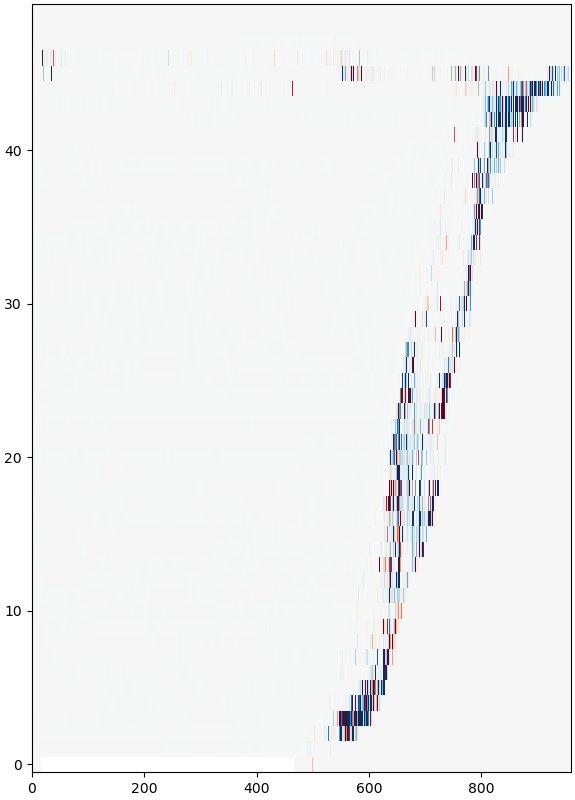

In [232]:
fig, axs = plt.subplots(1, 1, layout='constrained', figsize=(5.75, 8), sharex=True, sharey=True)
axs.pcolormesh(histS.mean(dim='time').T, cmap='RdBu_r', shading='nearest', vmin=-2e-7, vmax=2e-7)

## Volume and mixing budget

In isopycnal space, the thickness of an isopycnal layer is given by:
$$ \frac{\partial h}{\partial t} + \nabla_H \cdot (h \mathbf{u_H}) =  -w(\rho_2) + w(\rho_1)$$
where the layer spans $\rho_1$ to $\rho_2$, $\rho_2>\rho_1$, and $\mathbf{u_H}$ is the horizontal velocity vector, and $\nabla_H$ is the horizontal gradient operator.  $w>0$ is upwards (towards lower density).
We are currently just doing this in 2-D so 
$$ \frac{\partial h}{\partial t} + \frac{\partial}{\partial x} (h u) =  -w(\rho_2) + w(\rho_1)$$

Now the diapycnal velocity $w(\rho)$ can be related to the vertical buoyancy flux $J_b$ as:
$$ w(\rho) = \frac{\rho_0}{g} \frac{\partial J_b}{\partial \rho} $$
so we have:

$$ \frac{\partial h}{\partial t} + \frac{\partial}{\partial x} (h u) =  - \frac{\rho_0}{g} \left[ \frac{\partial J_b}{\partial \rho}\Big|_{\rho_2} - \frac{\partial J_b}{\partial \rho}\Big|_{\rho_1} \right]$$

For multiple layers, we can sum from the top to any isopycnal $\rho_k$:
$$ \frac{\partial }{\partial t}\left(\sum_{i=1}^k h_i\right) + \frac{\partial}{\partial x} \left(\sum_{i=1}^k h_i u_i\right) =  - \frac{\rho_0}{g} \frac{\partial J_b}{\partial \rho}\Big|_{\rho_k} $$

So below $\frac{\rho_0}{g} \frac{\partial J_b}{\partial \rho}\Big|_{\rho_k}$ is approximated by $\frac{\rho_0}{g} 0.2 (\epsilon_{k} - \epsilon_{k+1})/(\rho_{k+1}-\rho_k)$ where $\epsilon_k$ is the average epsilon in layer $k$.



<xarray.DataArray 'LaUH1TH' (layer_1TH_center: 100, XG: 800)> Size: 640kB
dask.array<truediv, shape=(100, 800), dtype=float64, chunksize=(100, 800), chunktype=numpy.ndarray>
Coordinates:
    YC                float64 8B 50.0
  * XG                (XG) float64 6kB -79.95 -79.85 -79.75 ... -0.15 -0.05
    dyG               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    dxC               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rAw               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    maskInW           (XG) bool 800B dask.array<chunksize=(800,), meta=np.ndarray>
    rLowW             (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rSurfW            (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
  * layer_1TH_center  (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96

<xarray.DataArray 'LaUH1TH' (layer_1TH_center: 100, XG: 800)> Size: 640kB
dask.array<nancumsum, shape=(100, 800), dtype=float64, chunksize=(100, 800), chunktype=numpy.ndarray>
Coordinates:
    YC                float64 8B 50.0
  * XG                (XG) float64 6kB -79.95 -79.85 -79.75 ... -0.15 -0.05
    dyG               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    dxC               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rAw               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    maskInW           (XG) bool 800B dask.array<chunksize=(800,), meta=np.ndarray>
    rLowW             (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rSurfW            (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
  * layer_1TH_center  (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96

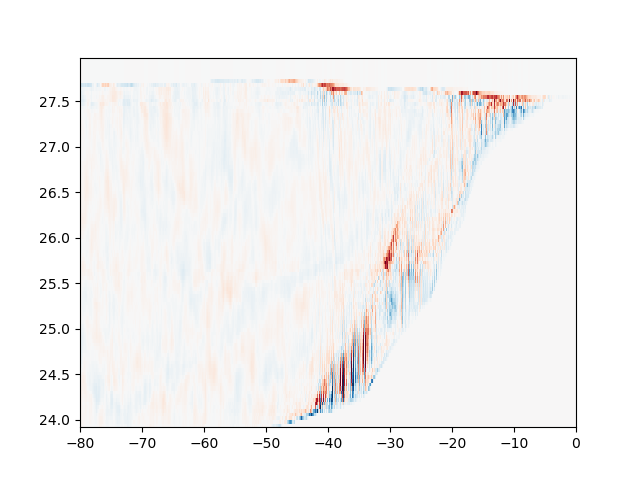

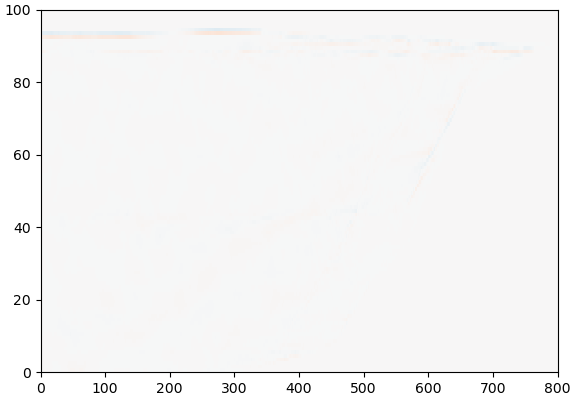

In [ ]:
# ww = dslayer.LaHw1TH.isel(time=slice(-3, -1)).sel(XG=slice(-80, None)).isel(YC=0).mean(dim='time')

dudx = dslayer.LaUH1TH.isel(time=slice(-5, -1)).sel(XG=slice(-80, None)).isel(YC=0).mean(dim='time').differentiate('XG') / 1000
display(dudx)
# W is the cumulative sum of the dudx:
w_diapyc = dudx.cumsum(dim='layer_1TH_center')

#dhdt = dslayer.LaHw1TH.isel(time=slice(-5, -1)).sel(XG=slice(-80, None)).isel(YC=0).differentiate('time').mean(dim='time')
H0 = dslayer.LaHw1TH.isel(time=-5).isel(YC=0).sel(XG=slice(-80, None))
H1 = dslayer.LaHw1TH.isel(time=-1).isel(YC=0).sel(XG=slice(-80, None))
dhdt = (H1 - H0) / 3600/12.4/4.5 # * dslayer.dxC.sel(XG=slice(-80, None)).values
dhdt = dhdt.rename('dhdt')

display(w_diapyc)
fig, ax = plt.subplots()
ax.pcolormesh(w_diapyc.XG, w_diapyc.layer_1TH_center, w_diapyc, cmap='RdBu_r', vmin=-3e-3, vmax=3e-3)

fig, ax = plt.subplots(layout='constrained', figsize=(5.75, 4))
ax.pcolormesh(dhdt, cmap='RdBu_r', vmin=-3e-3, vmax=3e-3)

<>:13: SyntaxWarning: invalid escape sequence '\p'
<>:18: SyntaxWarning: invalid escape sequence '\l'
<>:21: SyntaxWarning: invalid escape sequence '\e'
<>:13: SyntaxWarning: invalid escape sequence '\p'
<>:18: SyntaxWarning: invalid escape sequence '\l'
<>:21: SyntaxWarning: invalid escape sequence '\e'
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_18248/2636224852.py:13: SyntaxWarning: invalid escape sequence '\p'
  ax[2].set_xlabel('$\psi[x=-80 \mathrm{km}]$ [m$^2$/s]')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_18248/2636224852.py:18: SyntaxWarning: invalid escape sequence '\l'
  ax[3].set_xlabel('$\left<w\\right>  \mathrm{[m^2/s]}$')
/var/folders/kx/4c3bx_w92t31pqyvg6ws03200000gn/T/ipykernel_18248/2636224852.py:21: SyntaxWarning: invalid escape sequence '\e'
  ax[3].plot(-np.diff(hist.mean(dim='time').integrate('XC'))*1000/9.8/drho*1000 * 0.2 , hist.THETA_bin[:-1], label='0.8*\epsilon!')


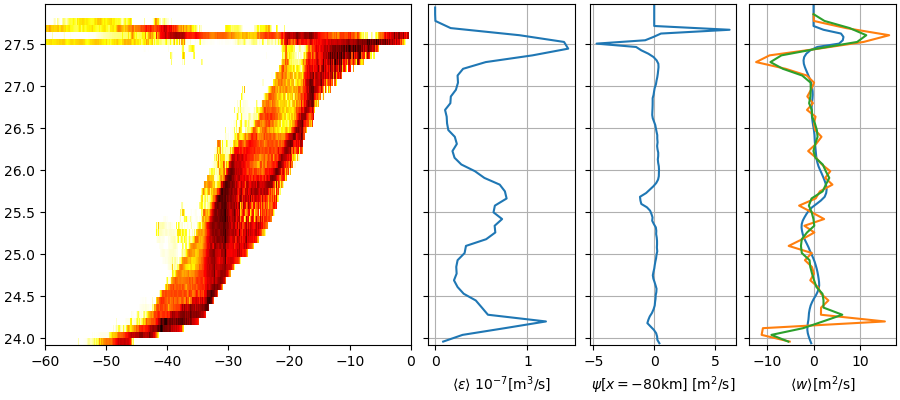

In [208]:
drho = 0.04*0.2 # 0.04 degrees and 0.2 kg/m3 per degree
fig, ax = plt.subplots(1, 4, figsize=(9, 4), layout='constrained', width_ratios=[1, 0.4, 0.4, 0.4,], sharey=True)

ax[0].pcolormesh(hist.XC, hist.THETA_bin, hist.mean(dim='time').T, shading='nearest', cmap='hot_r', norm=mcolors.LogNorm(vmin=1e-10, vmax=1e-5))
ax[0].set_xlim([-60, 0])
ax[1].plot(hist.mean(dim='time').mean(dim='XC')/1e-7, hist.THETA_bin)

ax[1].grid('on')
ax[1].set_xlabel(r'$\left<\epsilon\right>\ 10^{-7} \mathrm{[m^3/s]}$')


ax[2].plot(dslayer.LaUH1TH.sel(XG=-80, method='nearest').isel(time=-1) , dslayer.layer_1TH_center)
ax[2].set_xlabel('$\psi[x=-80 \mathrm{km}]$ [m$^2$/s]')
ax[2].grid('on')

ww2 = w_diapyc.integrate('XG')*1000
ax[3].plot(ww2, dslayer.layer_1TH_center)
ax[3].set_xlabel('$\left<w\\right>  \mathrm{[m^2/s]}$')
ax[3].grid('on')

ax[3].plot(-np.diff(hist.mean(dim='time').integrate('XC'))*1000/9.8/drho*1000 * 0.2 , hist.THETA_bin[:-1], label='0.8*\epsilon!')
ax[3].plot(-np.convolve(np.diff(hist.mean(dim='time').integrate('XC')), np.ones(3)/3, mode='same')*1000/9.8/drho*1000 * 0.2 , hist.THETA_bin[:-1])

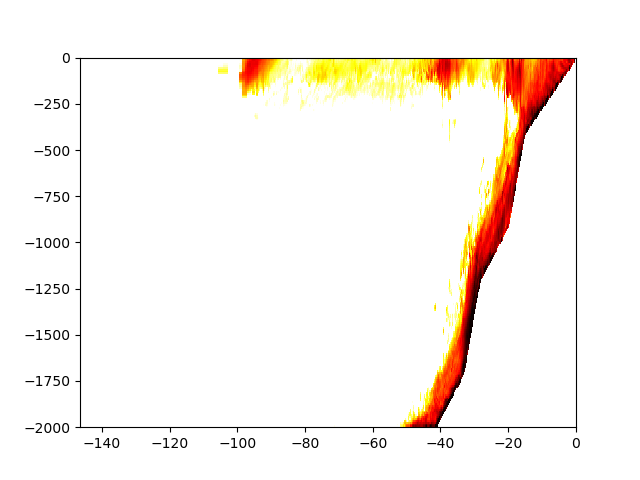

In [239]:
fig, ax = plt.subplots()
ax.pcolormesh(dsdiss0.XC, dsdiss0.Z, dsdiss0.KLeps.mean(dim='time'), cmap='hot_r', shading='nearest', rasterized=True, norm=mcolors.LogNorm(vmin=1e-10, vmax=1e-6))

<xarray.DataArray 'LaHw1TH' (layer_1TH_center: 100, XG: 800)> Size: 640kB
dask.array<mean_agg-aggregate, shape=(100, 800), dtype=float64, chunksize=(100, 800), chunktype=numpy.ndarray>
Coordinates:
    YC                float64 8B 50.0
  * XG                (XG) float64 6kB -79.95 -79.85 -79.75 ... -0.15 -0.05
    dyG               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    dxC               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rAw               (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    maskInW           (XG) bool 800B dask.array<chunksize=(800,), meta=np.ndarray>
    rLowW             (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
    rSurfW            (XG) float64 6kB dask.array<chunksize=(800,), meta=np.ndarray>
  * layer_1TH_center  (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96

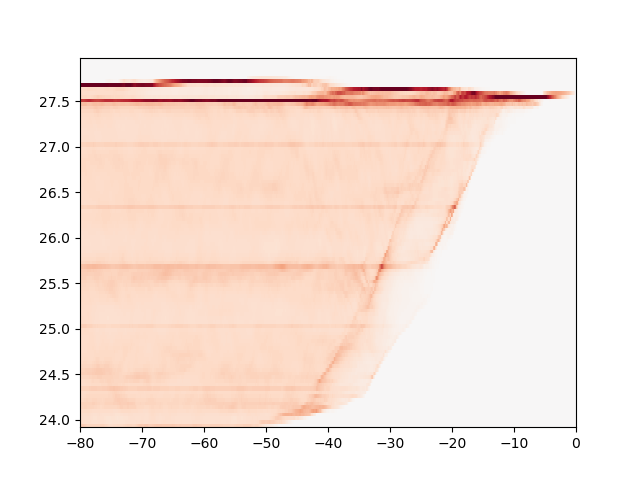

In [131]:

display(ww)
fig, ax = plt.subplots()
ax.pcolormesh(ww.XG, ww.layer_1TH_center, ww.values, cmap='RdBu_r', shading='nearest', clim=[-1e2, 1e2])

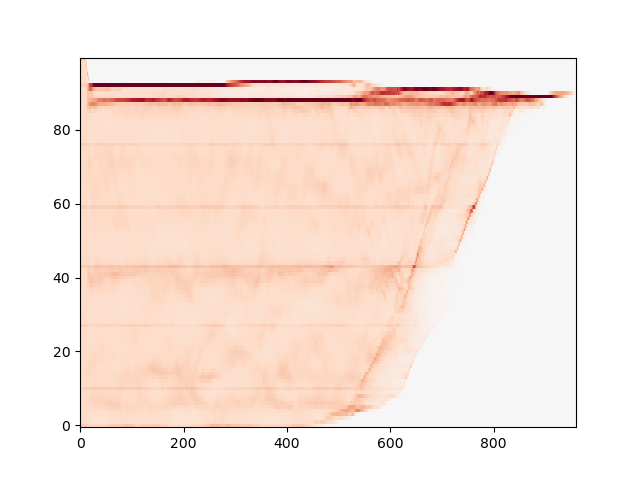

In [135]:
fig, ax = plt.subplots()
ax.pcolormesh(dslayer.LaHw1TH.isel(YC=0).isel(time=slice(-2, -1)).mean(dim='time'), cmap='RdBu_r', shading='nearest', clim=[-1e2, 1e2])

In [136]:
dslayer

<xarray.Dataset> Size: 51MB
Dimensions:              (XC: 960, YC: 1, XG: 960, YG: 1, Z: 200, Zp1: 201,
                          Zu: 200, Zl: 200, layer_1TH_bounds: 101,
                          layer_1TH_center: 100, layer_1TH_interface: 99,
                          time: 30)
Coordinates: (12/46)
  * XC                   (XC) float64 8kB 2.957e+03 8.554e+03 ... 1.466e+05
  * YC                   (YC) float64 8B 50.0
  * XG                   (XG) float64 8kB -146.6 -140.7 -135.4 ... -0.15 -0.05
  * YG                   (YG) float64 8B 0.0
  * Z                    (Z) float64 2kB -5.0 -15.0 ... -1.985e+03 -1.995e+03
  * Zp1                  (Zp1) float64 2kB 0.0 -10.0 -20.0 ... -1.99e+03 -2e+03
    ...                   ...
    dyF                  (YC, XC) float64 8kB dask.array<chunksize=(1, 960), meta=np.ndarray>
  * layer_1TH_bounds     (layer_1TH_bounds) float64 808B 23.92 23.96 ... 27.98
  * layer_1TH_center     (layer_1TH_center) float64 800B 23.94 23.98 ... 27.96
  * layer_1TH_interface  (layer_1TH_interface) float64 792B 23.96 24.0 ... 27.94
    iter                 (time) int64 240B dask.array<chunksize=(1,), meta=np.ndarray>
  * time                 (time) timedelta64[ns] 240B 0 days 12:24:00 ... 15 d...
Data variables:
    LaUH1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
    LaHw1TH              (time, layer_1TH_center, YC, XG) float64 23MB dask.array<chunksize=(1, 100, 1, 960), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='../results/Sl...